In [1]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.python.ops import array_ops
import numpy as np
import matplotlib.pyplot as plt
import processes
from processes import orstein_uhlenbeck as ou
import utils
from utils import kalman
import buildingblocks
from buildingblocks import stupidcell

/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Network

In [2]:
def build_optimizer(loss, learning_rate, grad_clip):
    ''' Build optmizer for training, using gradient clipping.
    
        Arguments:
        loss: Network loss
        learning_rate: Learning rate for optimizer
    
    '''
    
    # Optimizer for training, using gradient clipping to control exploding gradients
    tvars = tf.trainable_variables()
    grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), grad_clip)
    train_op = tf.train.AdamOptimizer(learning_rate)
    optimizer = train_op.apply_gradients(zip(grads, tvars))
    
    return optimizer

In [3]:

graph=tf.Graph()


In [4]:
logs_dir = './graphs/'
batch_size=128
num_steps=1095
lstm_layers= 1
lstm_size= 10
inputs_dim= 1
alpha = 0.1

In [5]:
with graph.as_default():
    inputs_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='inputs')
    targets_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='targets')
    learning_rate= tf.placeholder( tf.float32 , name='lr')
    grad_clip= tf.placeholder( tf.float32 , name='clip')

In [6]:

with graph.as_default():
    cell = stupidcell.StupidRNNCell(1,activation= None)
    
    '''
    stupidlstm = stupidcell.StupidLSTMCell(lstm_size)
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm,stupidlstm])
    '''
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    W = tf.Variable(tf.random_normal([lstm_size, lstm_size]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ lstm_size]), dtype=tf.float32)
    def residual_wrapper( i,o):
        out = tf.matmul( o, W)+b
        out = tf.sigmoid( out)
        return array_ops.concat([i,out],1)
    lstm = tf.contrib.rnn.ResidualWrapper( lstm, (lambda i, o: array_ops.concat([i,o],1)) )
    
    rnn_cell = tf.contrib.rnn.MultiRNNCell([lstm,cell])
# 'outputs' is a tensor of shape [batch_size, max_time, cell_state_size]

# defining initial state
    initial_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

# 'state' is a tensor of shape [batch_size, cell_state_size]
    outputs, state = tf.nn.dynamic_rnn(rnn_cell, inputs_,
                                   initial_state=initial_state,
                                   dtype=tf.float32)
    '''
    W = tf.Variable(tf.random_normal([lstm_size, inputs_dim]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ inputs_dim]), dtype=tf.float32) # biases
    shape = outputs.shape
    
    outputs = tf.matmul( tf.reshape( outputs, [-1, lstm_size]), W ) + b
    outputs = tf.reshape( outputs, (shape[0],shape[1],b.shape[0]))
    '''


(128, 2)


In [7]:
with graph.as_default():
    square=  tf.reduce_mean( tf.square( outputs - targets_),axis=0 )
    shape = square.shape
    square = tf.reshape(square, [shape[0],])
    def power(x):
        alpha =0.96
        return (1-alpha)*tf.pow(alpha,x)
    weights = tf.map_fn(  power, tf.range( start= shape[0]-1, delta=-1., limit= -0.5  ) )
    cost = tf.losses.compute_weighted_loss( square, weights )
    optimizer= build_optimizer(cost, learning_rate, grad_clip)
    

## Batch

In [8]:


def batch_1( batch_size, num_steps, noise, dictionary,):
    while True:
        invariant_std = 0.3 +0.6*np.random.rand()
        rand = np.random.rand()
        lbd = 10**( (np.random.randint(3) -1 ) ) 
        sigma = invariant_std*np.sqrt(2*lbd)
        dictionary['sigma'] = sigma
        dictionary['lbd'] = lbd

        batch = np.random.randn( batch_size,num_steps+1,1)*noise
        trend =np.reshape( ou.process(**dictionary)[: num_steps+1] , [-1,1] )
        for i in range(batch_size):
            batch[i,:,:]=batch[i,:,:]+trend[:,:]
        
        yield (batch[:,:-1,:] , batch[:,1:,:],trend, dictionary )

    

In [9]:
invariant_std = 0.2
lbd = 1.
sigma = invariant_std*np.sqrt(2*lbd)
start= 365
dictionary = {'deltaT': 1./365,
              'T':3}
noise= 0.1/np.sqrt( dictionary['deltaT'])
generator1 = batch_1( batch_size , num_steps,noise ,dictionary)

In [10]:
generator= generator1

## Training

## Batch 1

-3.6462344218511147


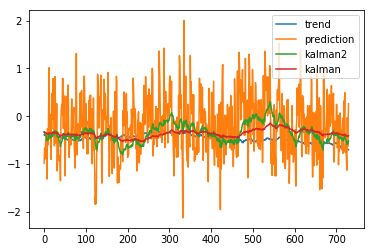

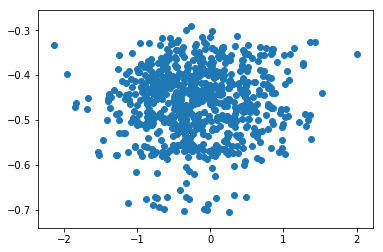

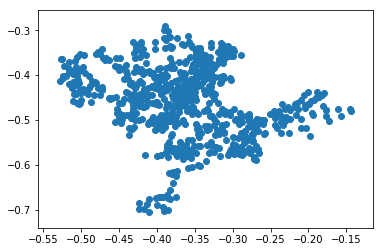

-3.646466950979085


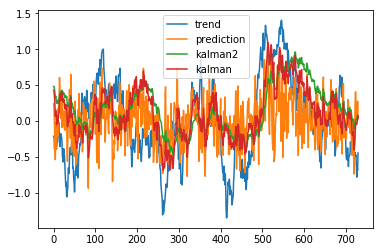

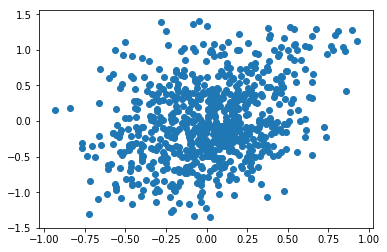

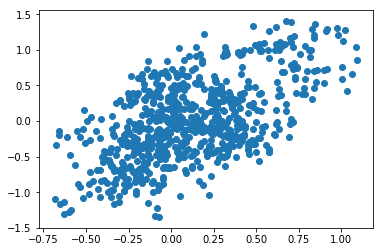

-3.6465761040803057


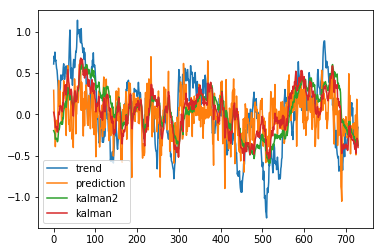

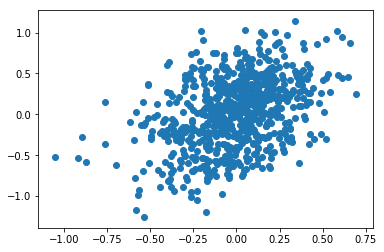

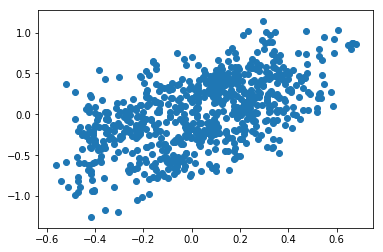

-3.6465812130831194


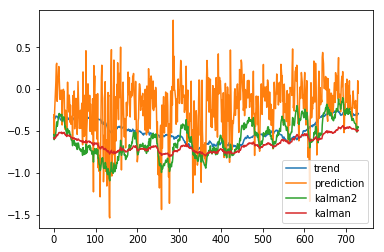

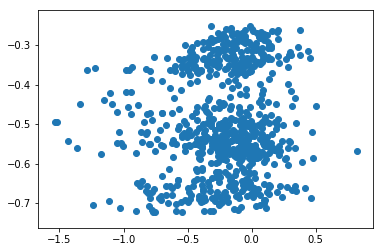

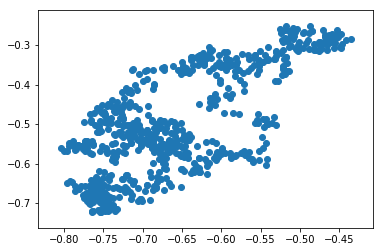

-3.6464291830547166


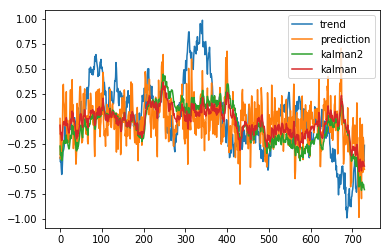

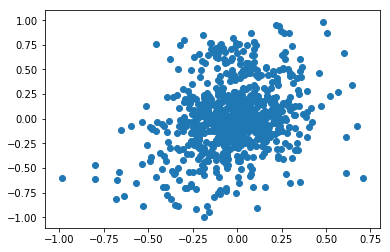

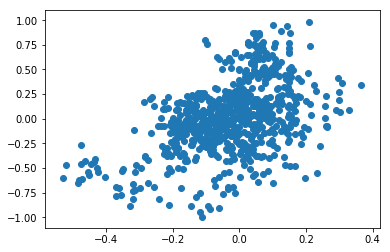

-3.645844910386951


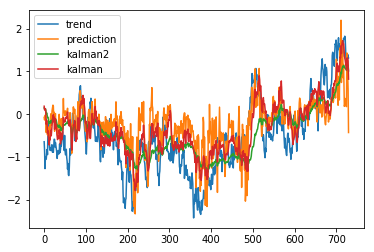

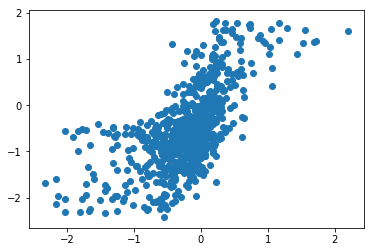

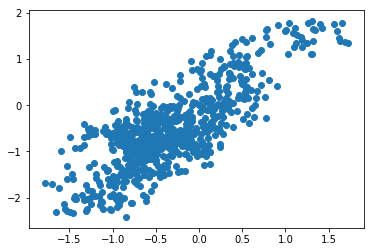

-3.646381378732623


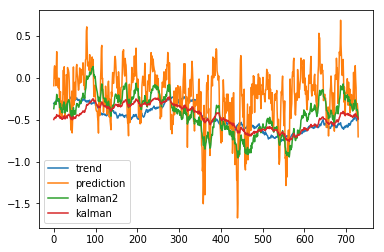

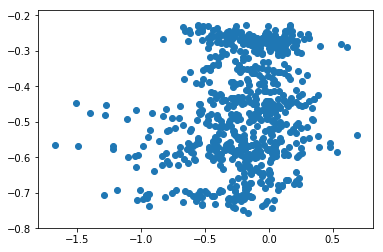

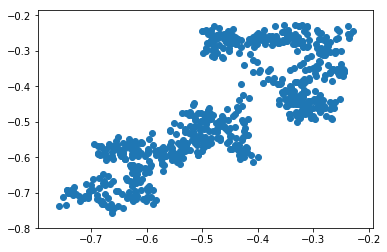

-3.6465391363948596


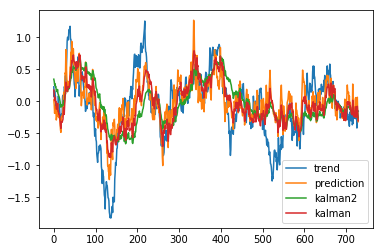

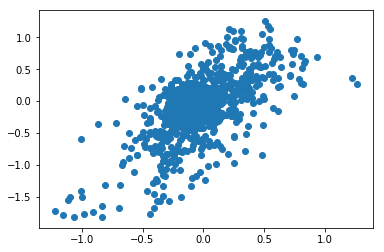

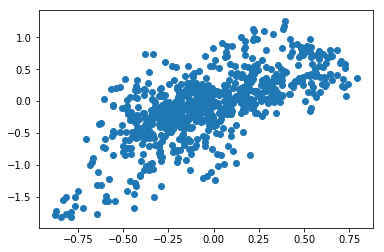

-3.6463934854604316


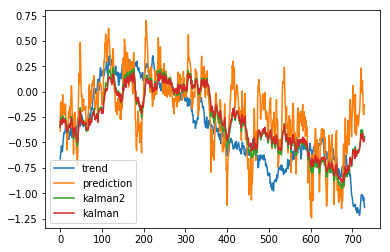

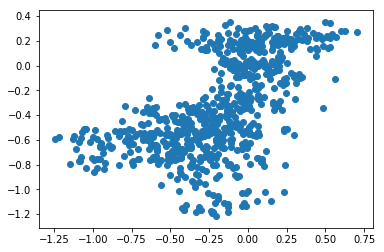

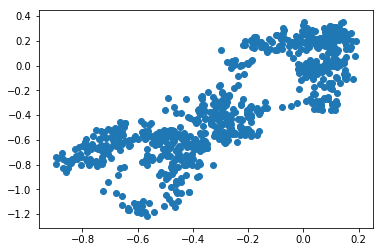

-3.646530174277724


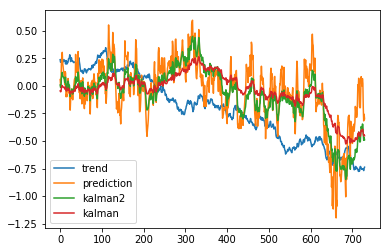

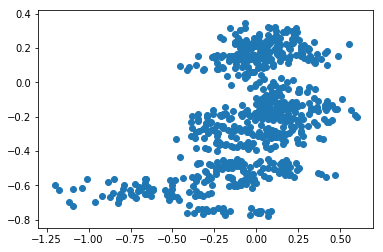

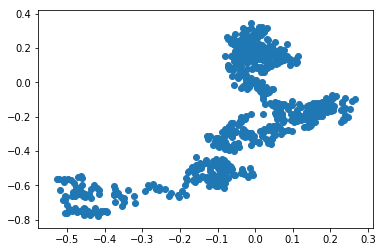

-3.6465409745927913


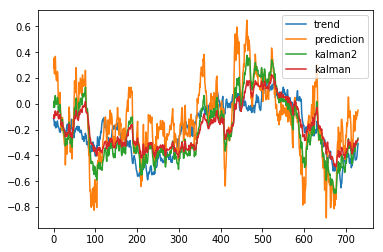

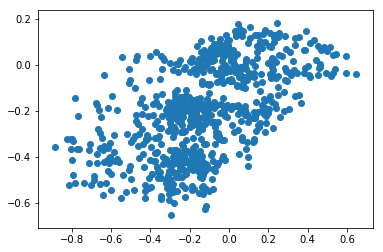

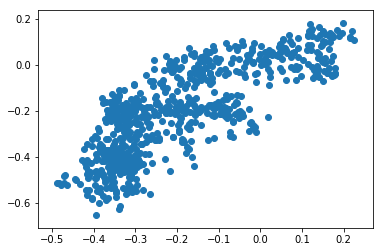

-3.6466651741415275


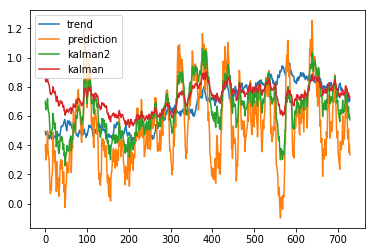

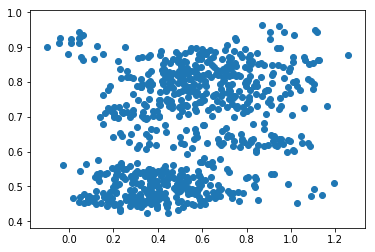

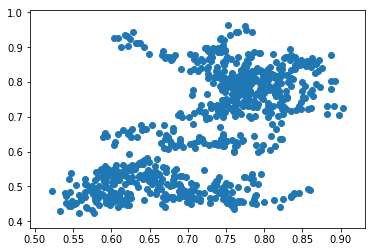

-3.646541980886833


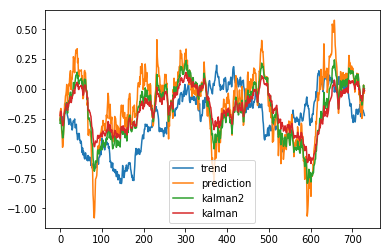

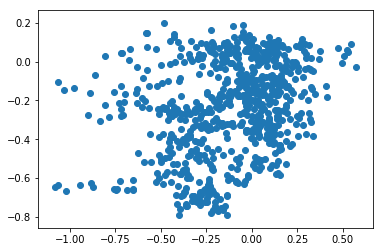

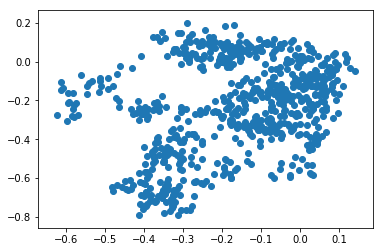

-3.646605008840562


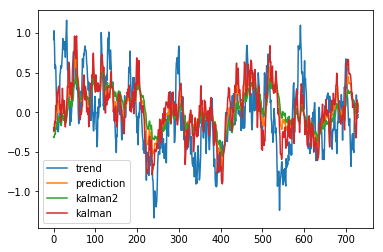

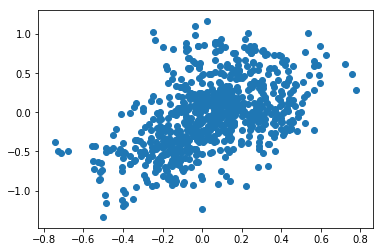

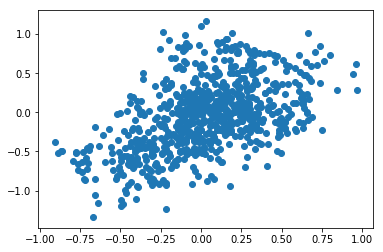

-3.646395383263008


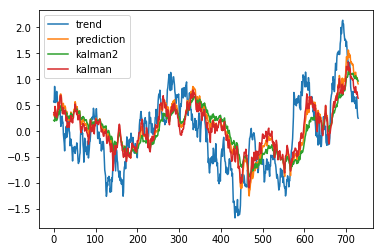

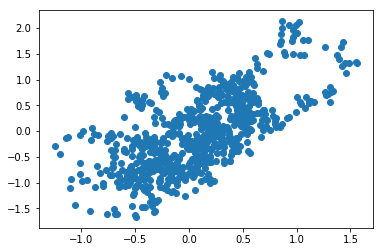

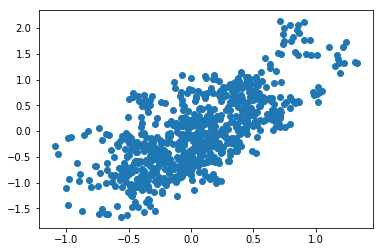

-3.6465952869970364


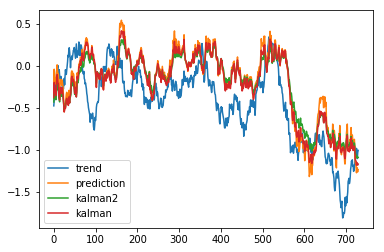

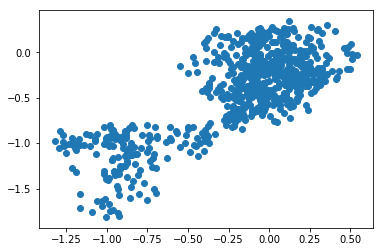

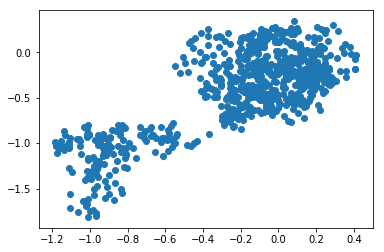

-3.646678581926973


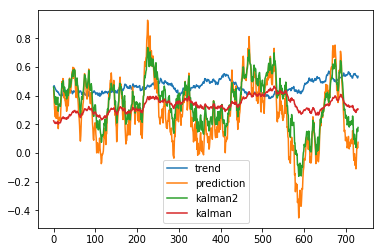

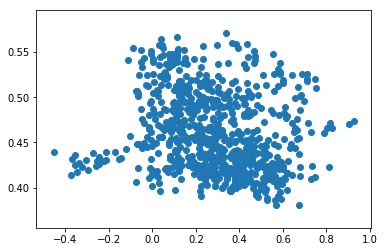

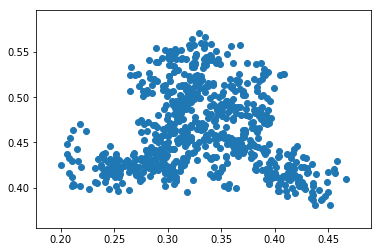

-3.646507141971962


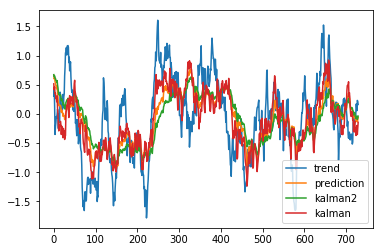

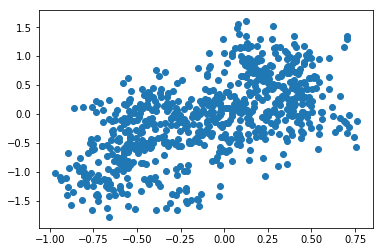

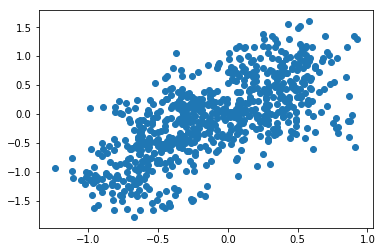

-3.6464125759433967


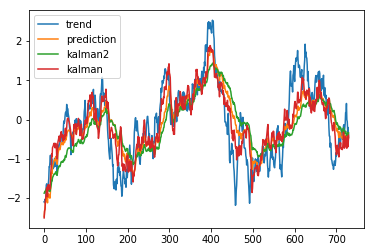

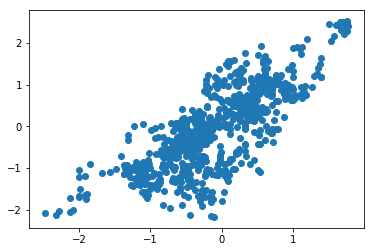

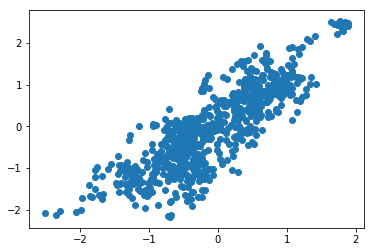

-3.646523553505541


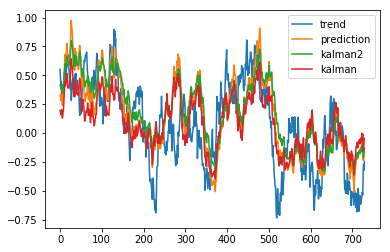

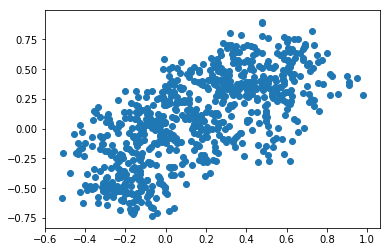

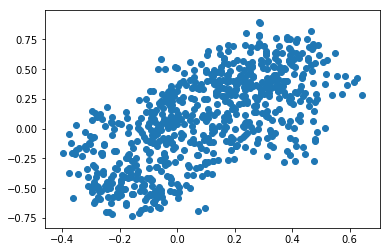

-3.6465779832564307


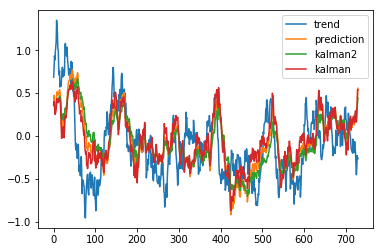

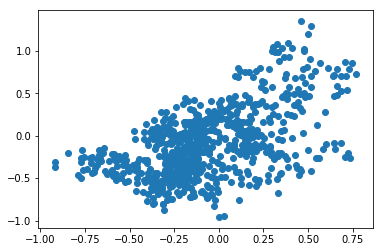

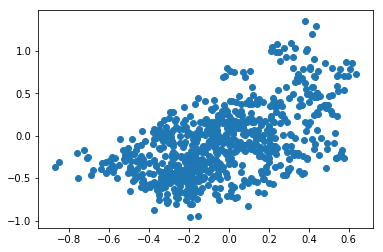

-3.6465365785174084


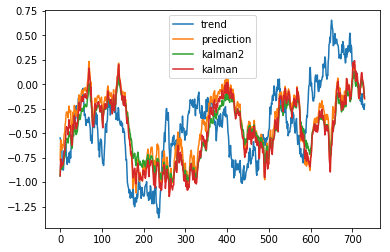

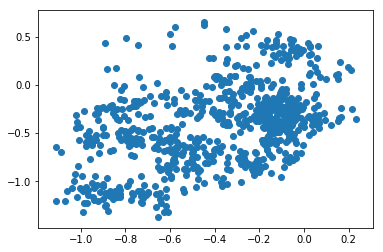

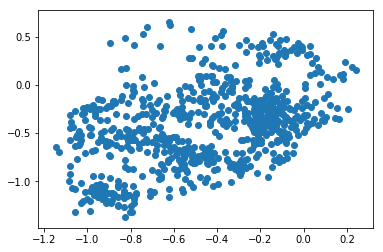

-3.6465432235039783


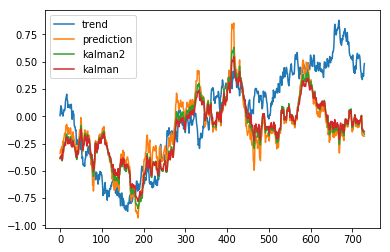

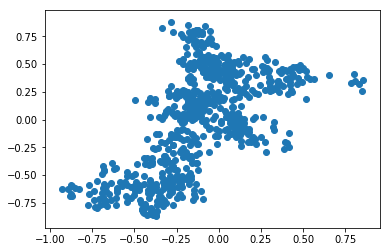

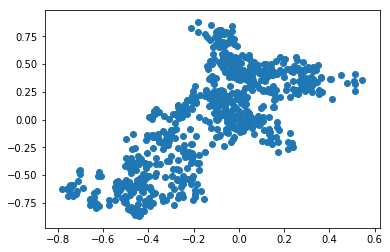

-3.6463388438336564


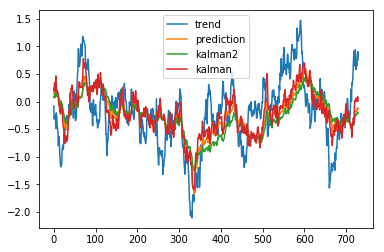

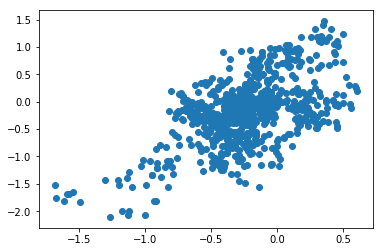

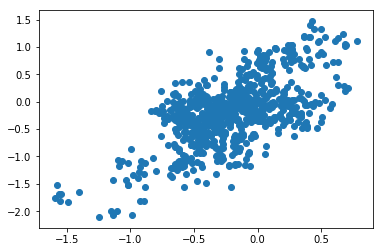

-3.6466880909632904


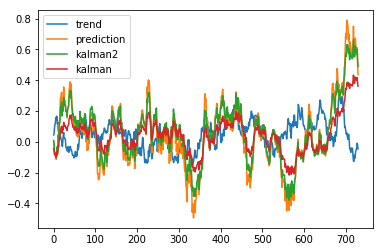

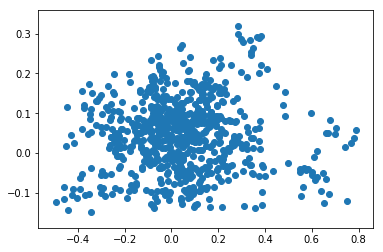

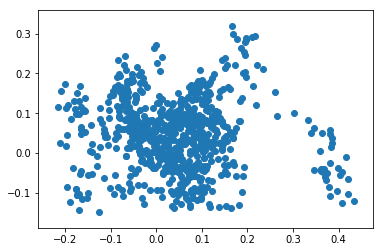

-3.646670252643527


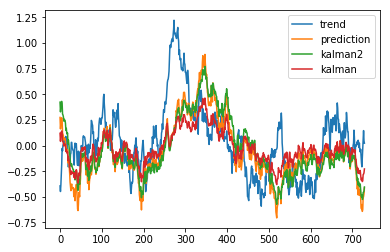

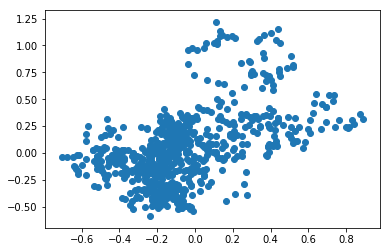

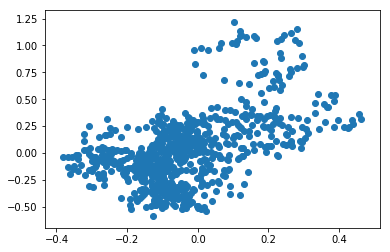

-3.646654722839595


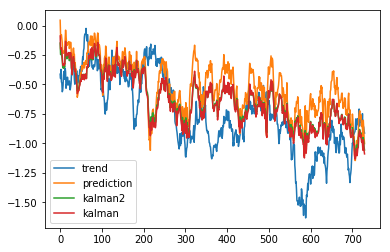

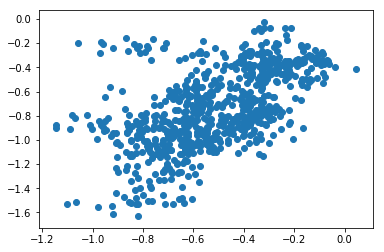

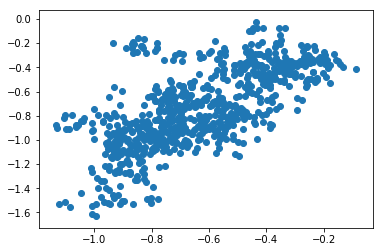

-3.646576928533615


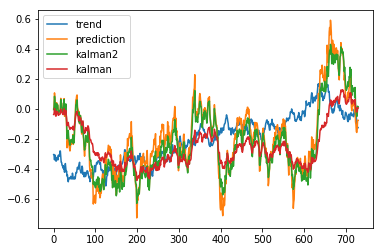

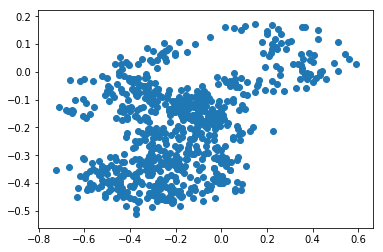

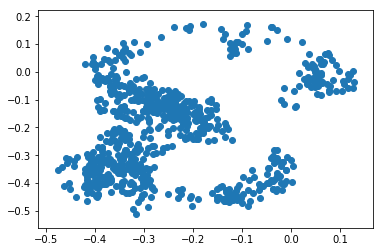

-3.64667089409195


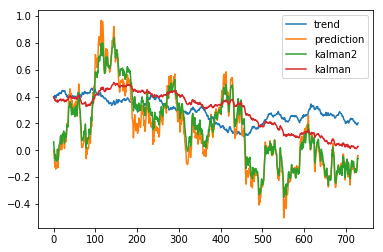

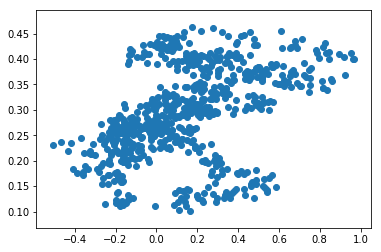

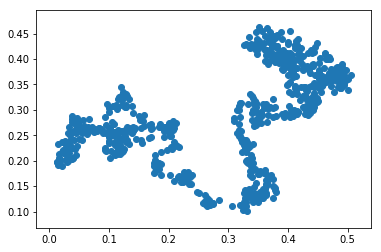

-3.64633700749837


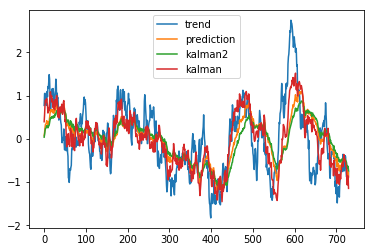

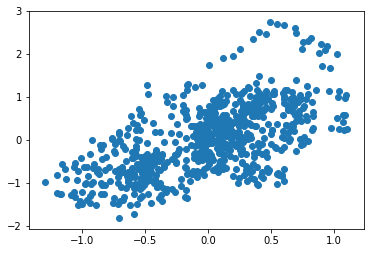

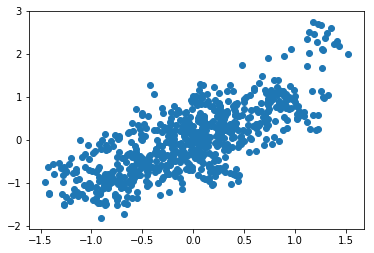

-3.6465751403942717


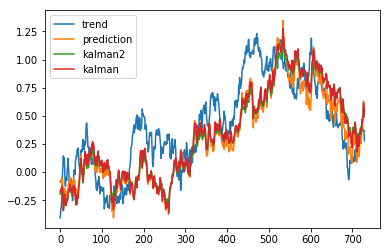

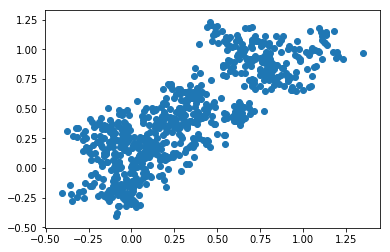

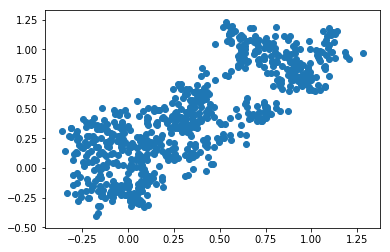

-3.646666761580856


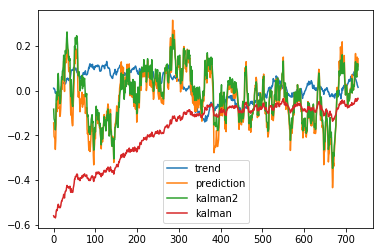

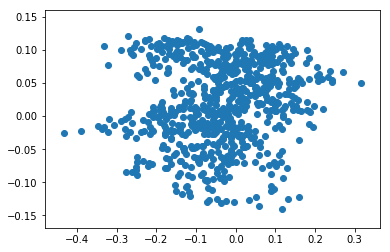

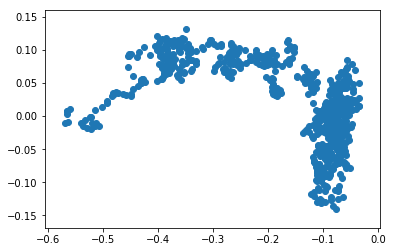

-3.6465614343527717


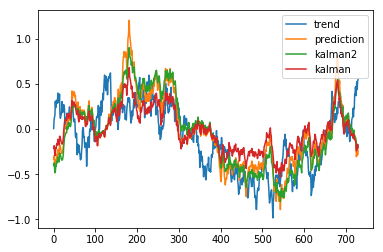

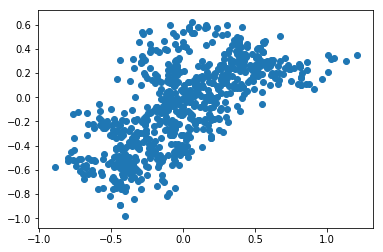

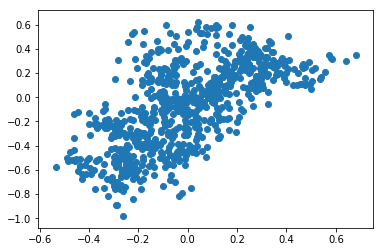

-3.646652685804294


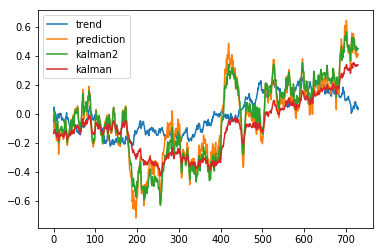

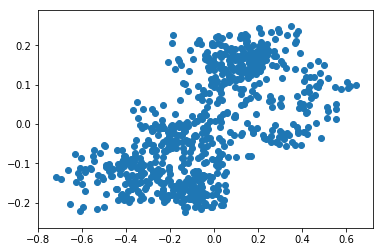

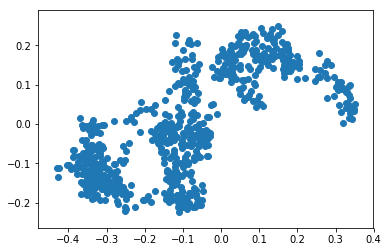

-3.6463724766857935


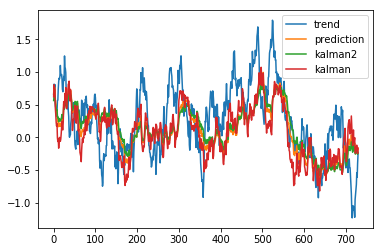

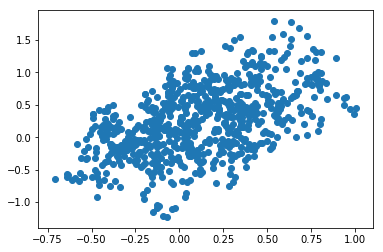

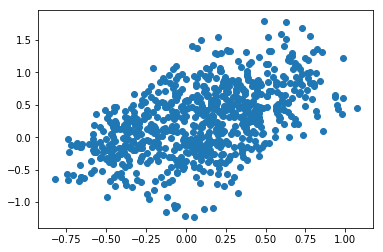

-3.646680706040935


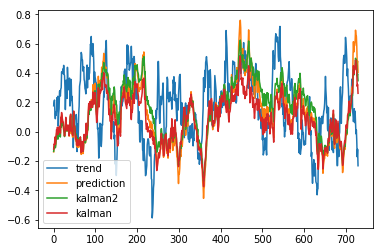

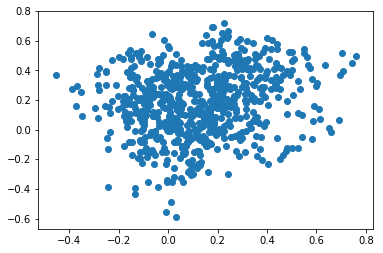

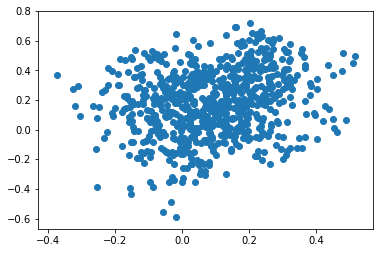

-3.646621203143151


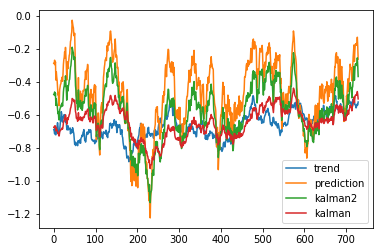

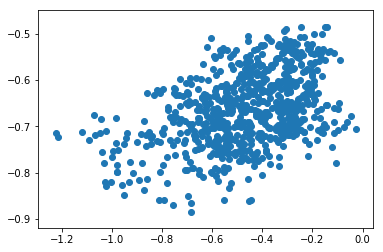

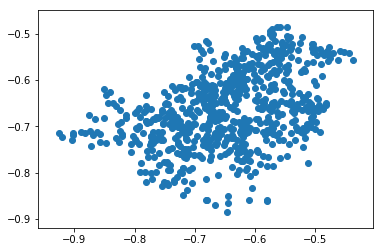

-3.6466127173975122


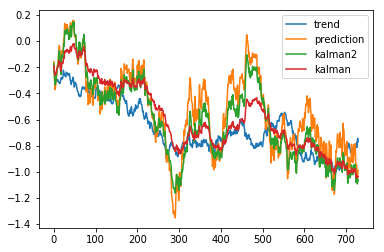

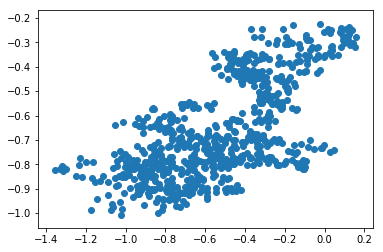

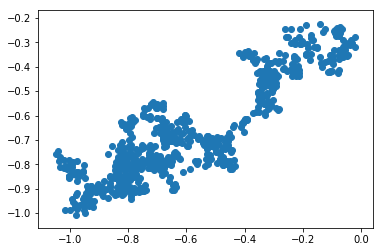

-3.646109060943128


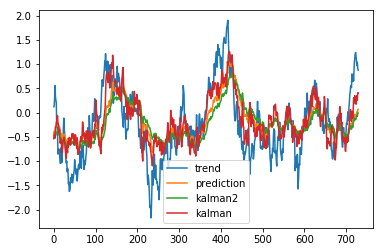

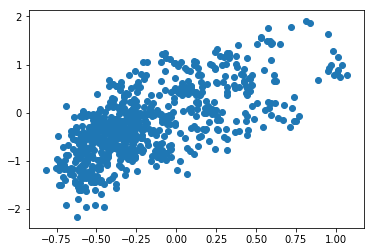

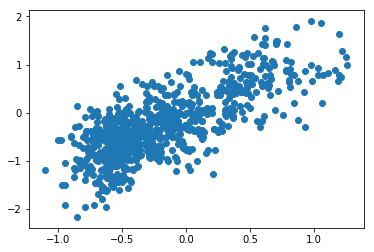

-3.646627671644093


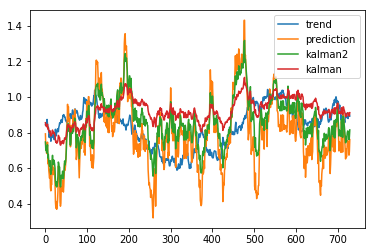

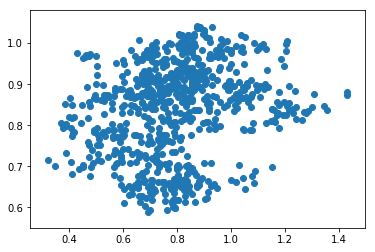

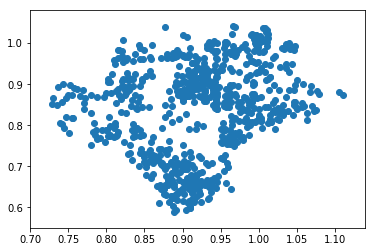

-3.6463803433347506


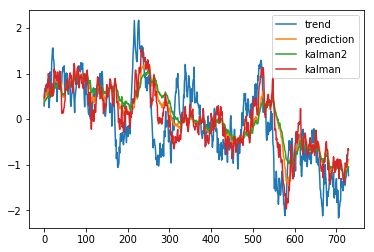

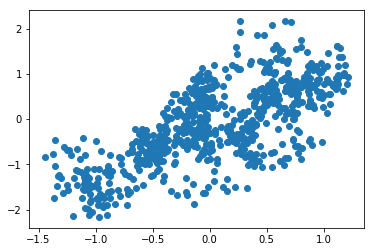

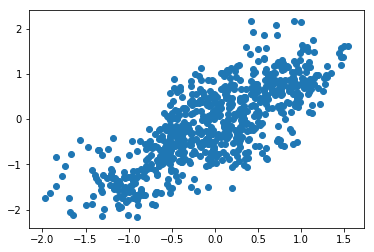

-3.6465076472144586


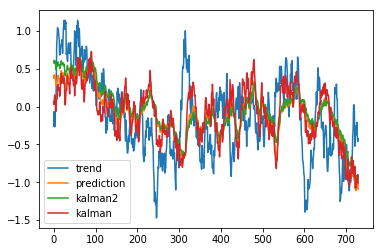

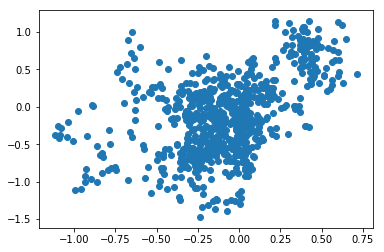

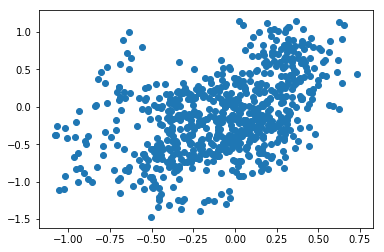

-3.6465071643237037


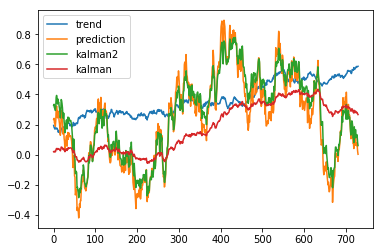

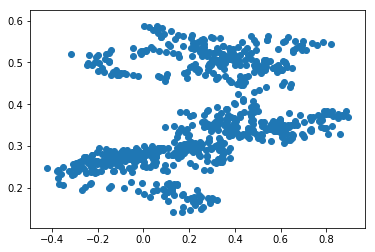

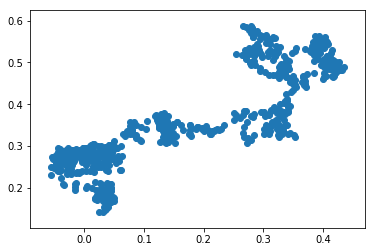

-3.6466529468074453


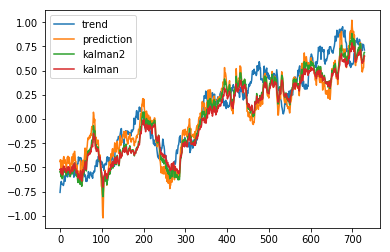

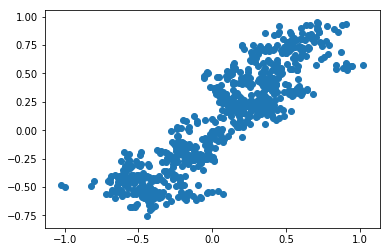

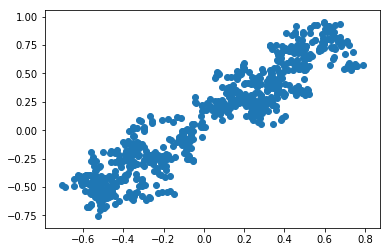

-3.646597089339049


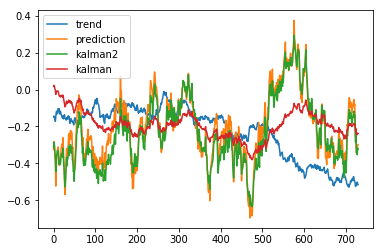

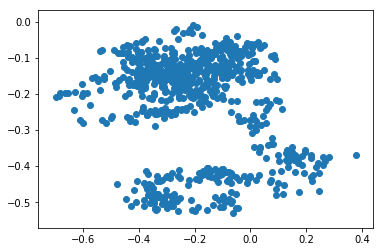

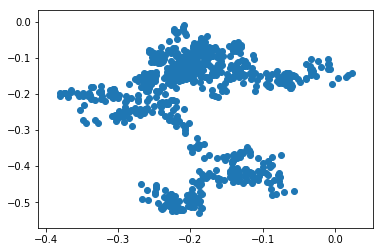

-3.6465337454341364


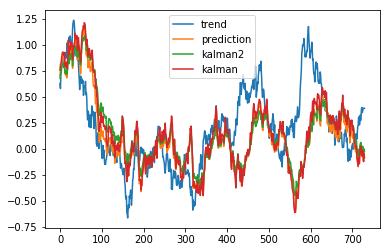

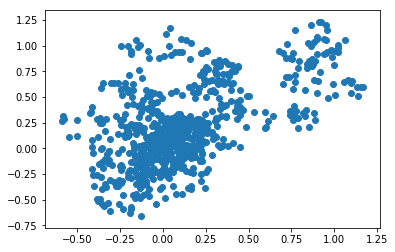

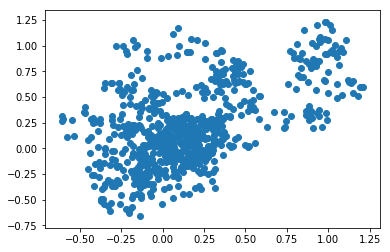

-3.646529293479399


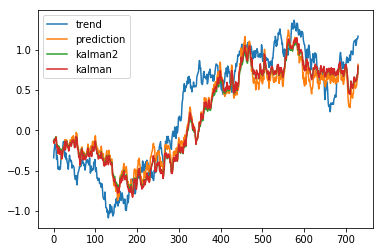

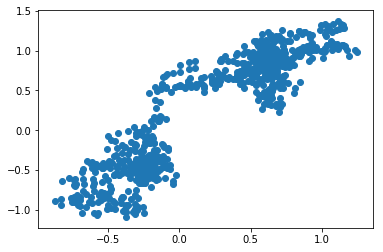

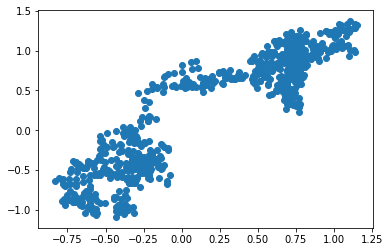

-3.6465982956346137


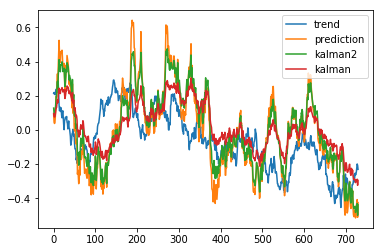

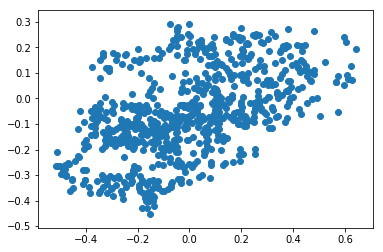

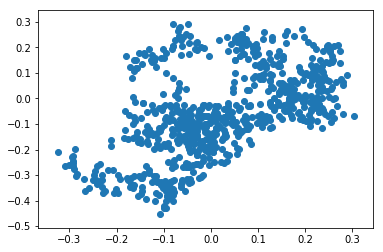

-3.6466223083902163


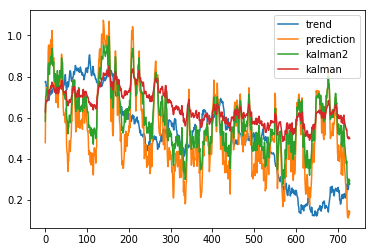

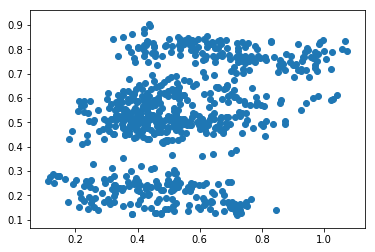

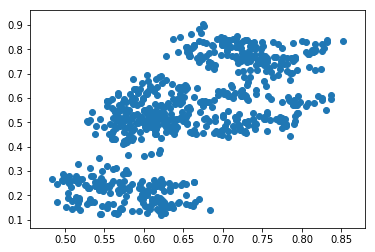

-3.6462577214464558


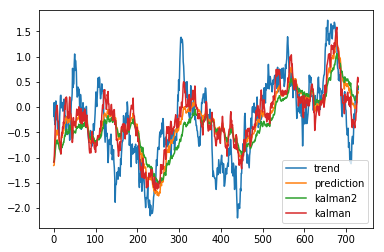

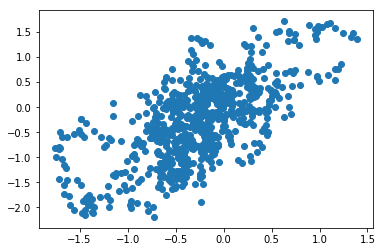

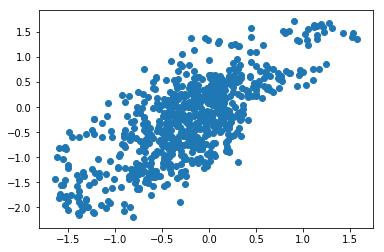

-3.6466011745855225


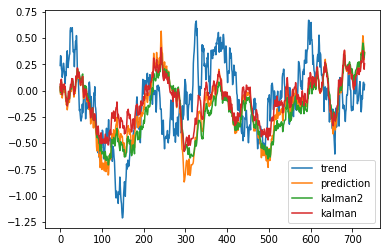

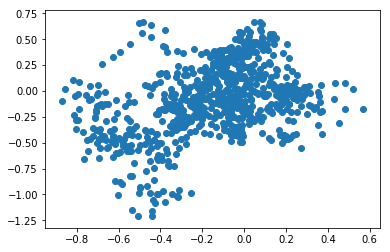

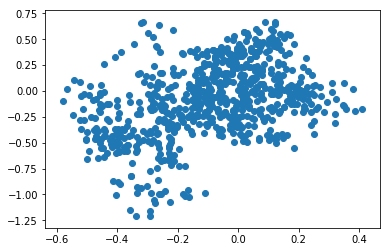

-3.646567236259581


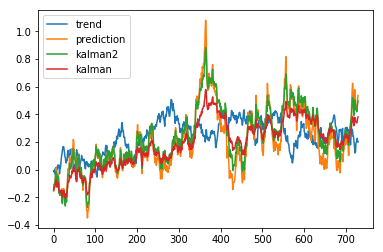

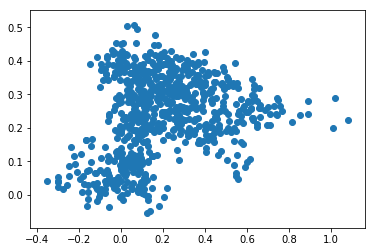

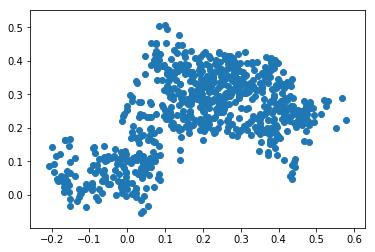

-3.6465386982075882


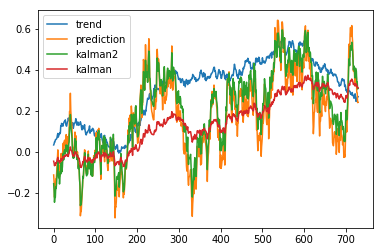

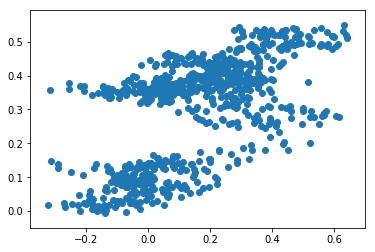

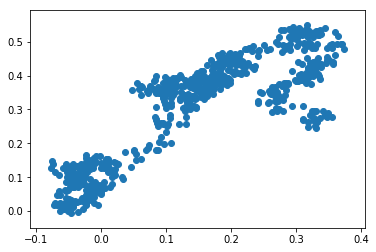

-3.64644268420525


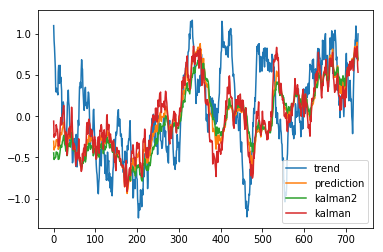

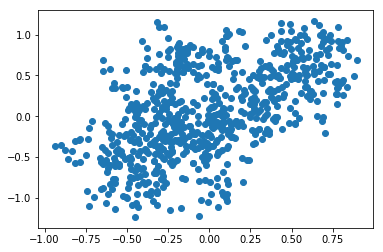

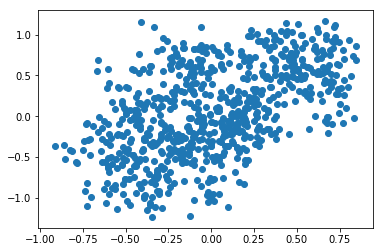

-3.6466674472671015


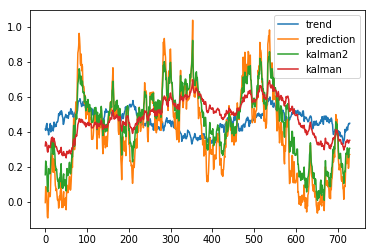

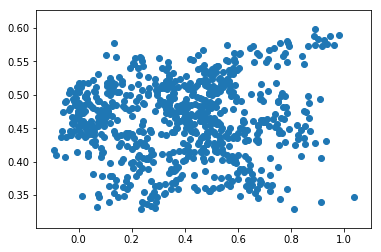

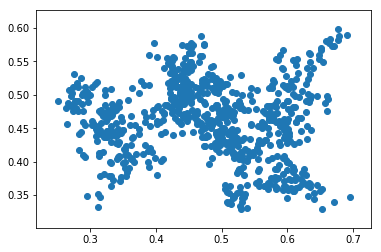

-3.6464652047492576


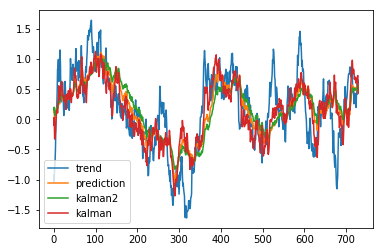

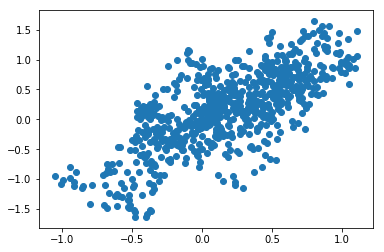

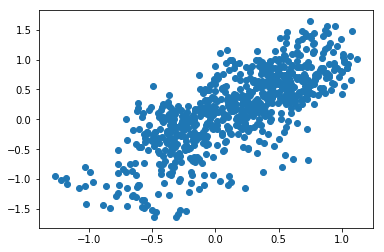

-3.6465163953602326


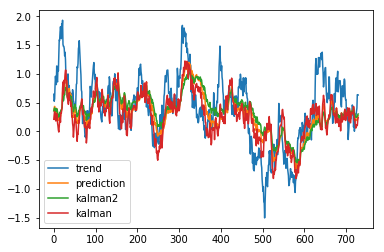

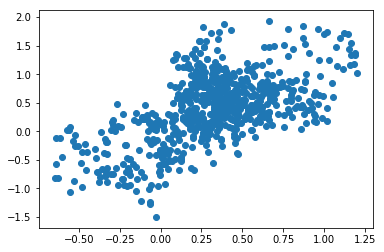

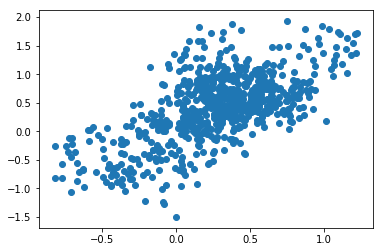

-3.646672628214584


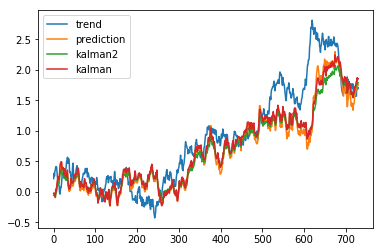

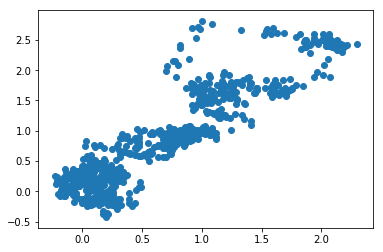

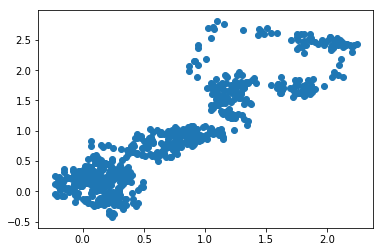

-3.6466518348082912


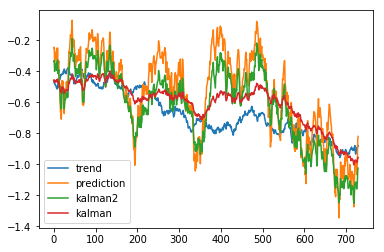

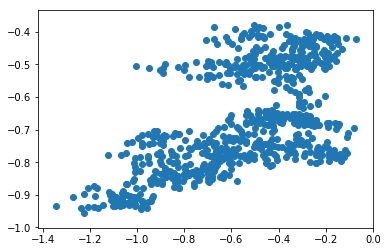

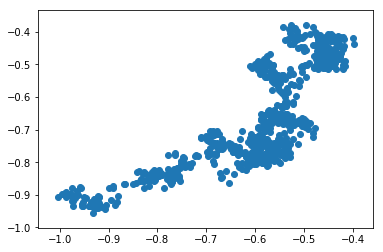

-3.6466533924452973


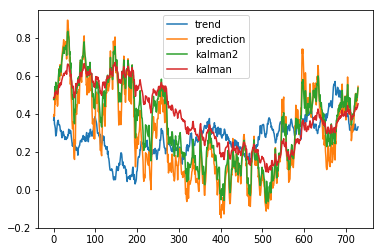

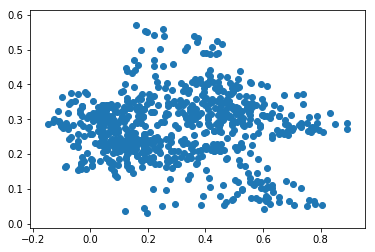

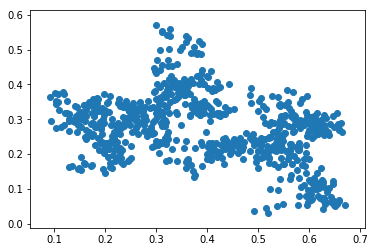

-3.6463813913054777


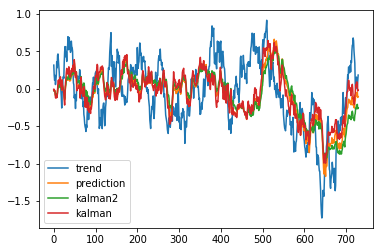

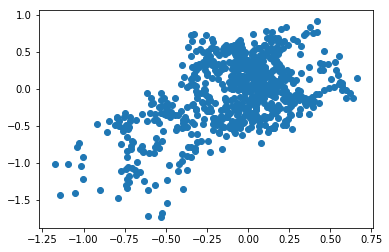

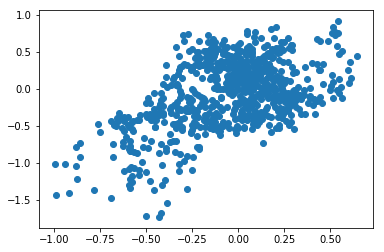

-3.6465718421153737


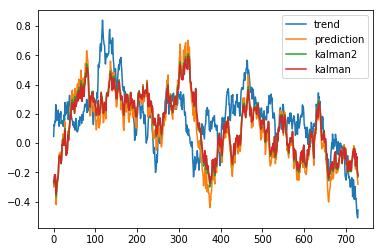

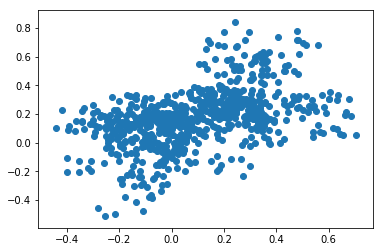

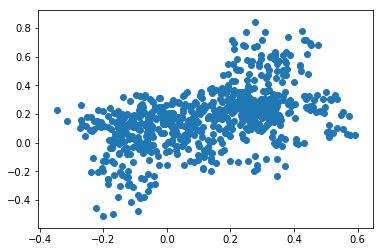

-3.6465550536289824


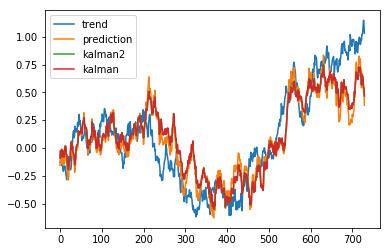

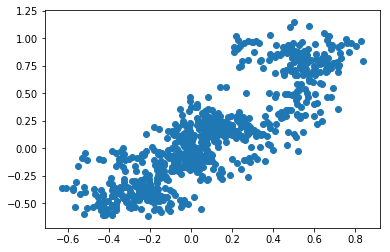

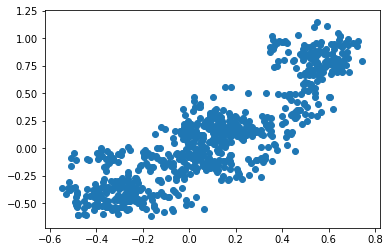

-3.6464165382552904


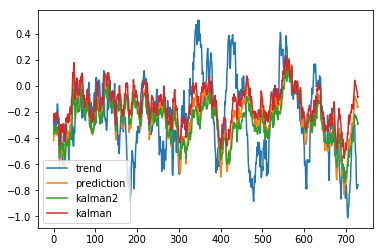

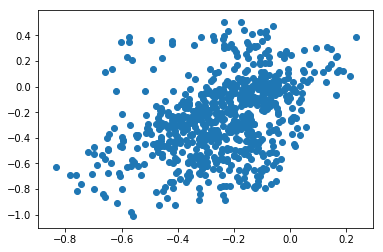

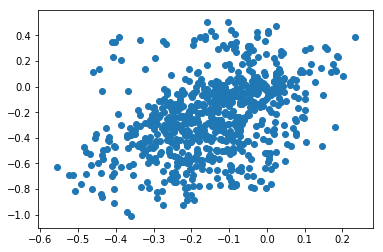

-3.646513328049333


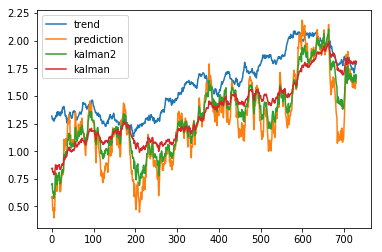

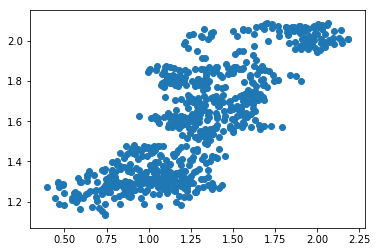

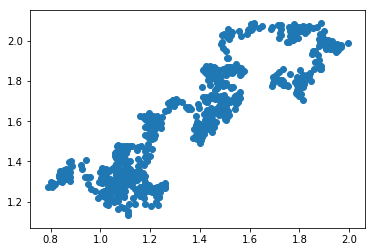

-3.646564619475977


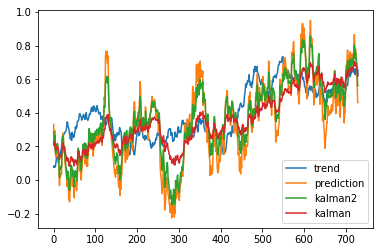

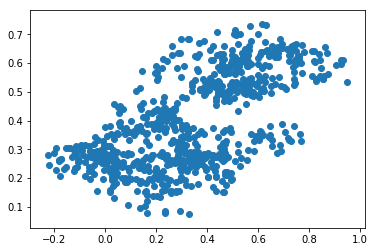

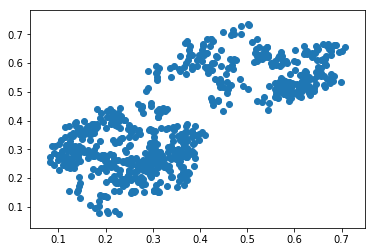

-3.646628866065295


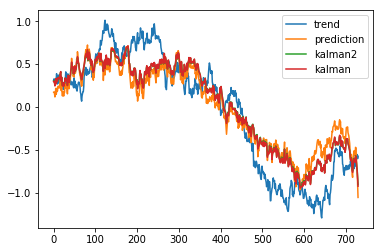

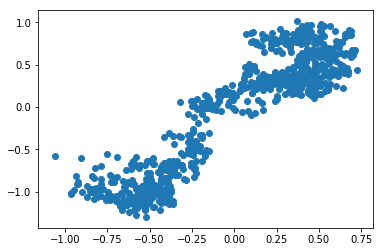

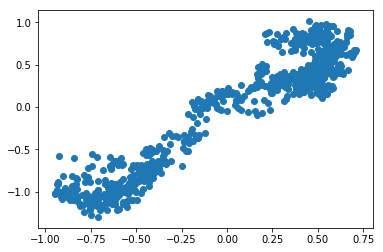

-3.6464153883047414


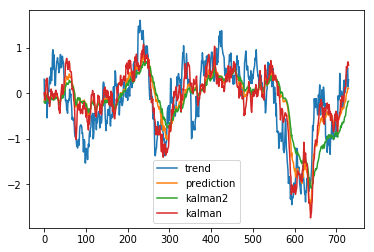

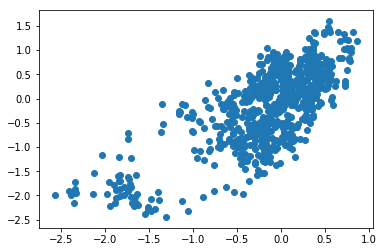

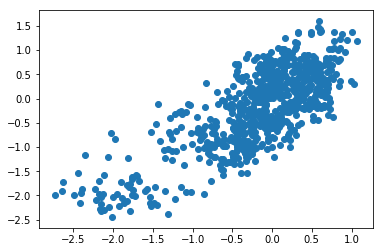

-3.646267510810868


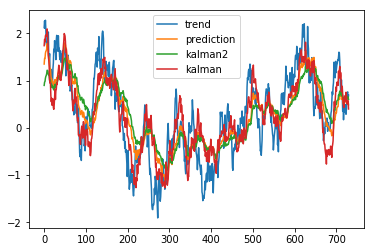

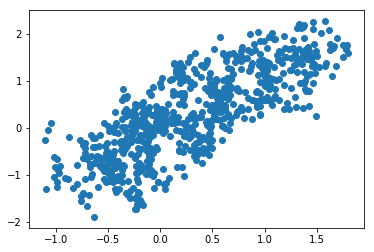

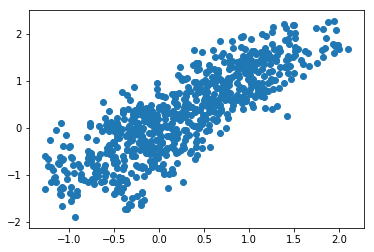

-3.646567834634335


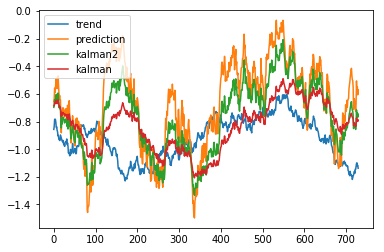

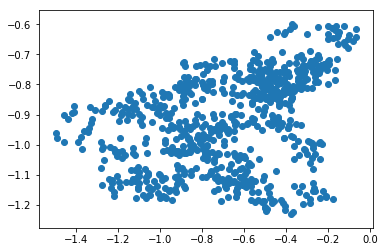

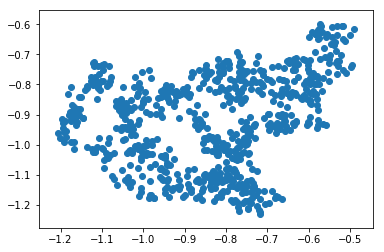

-3.646261197840796


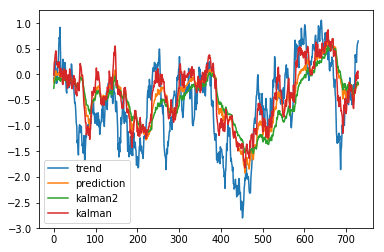

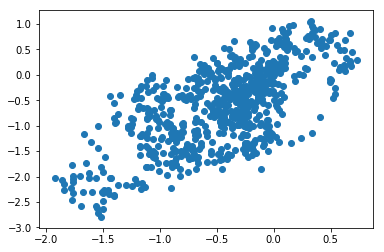

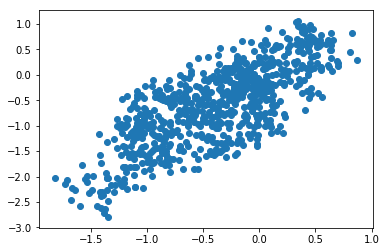

-3.646583256637679


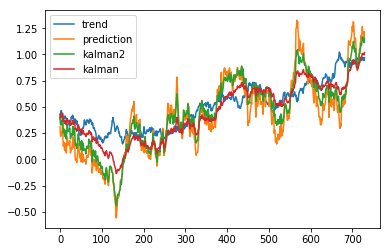

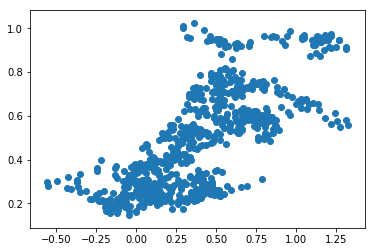

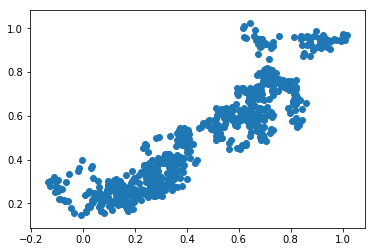

-3.646669980697335


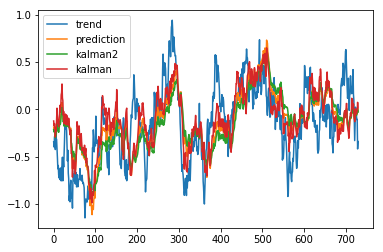

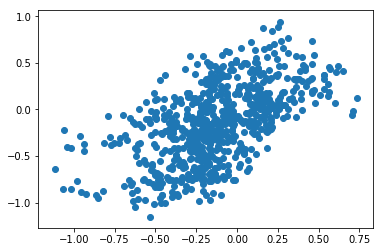

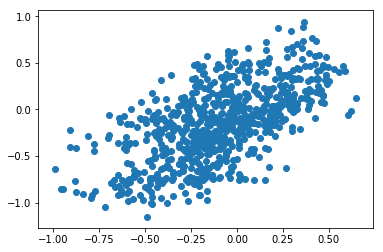

-3.6466458959970636


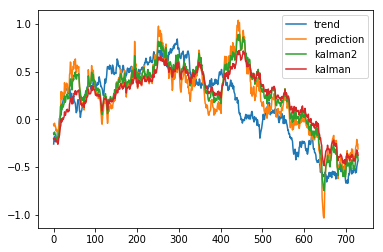

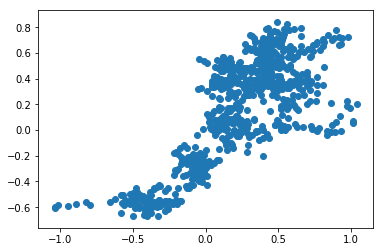

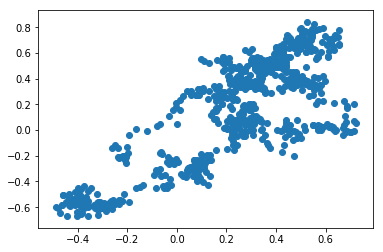

-3.646237525250764


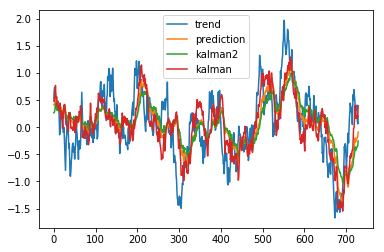

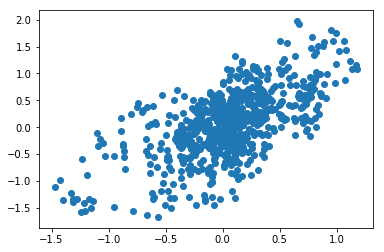

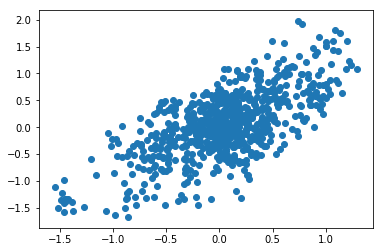

-3.6465267654042703


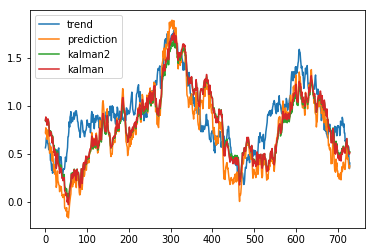

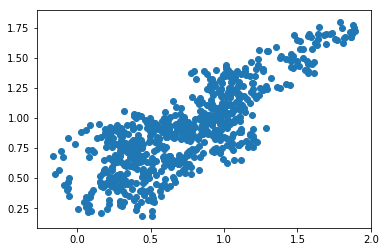

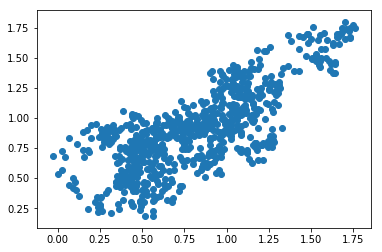

-3.646661144308747


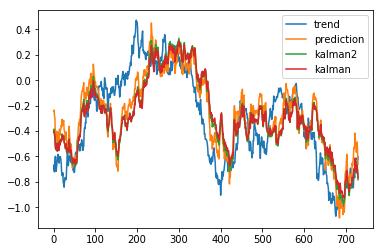

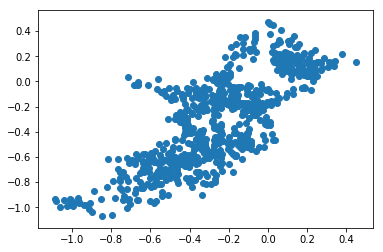

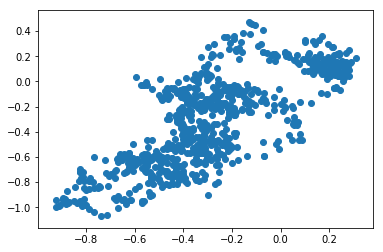

-3.6464612177573157


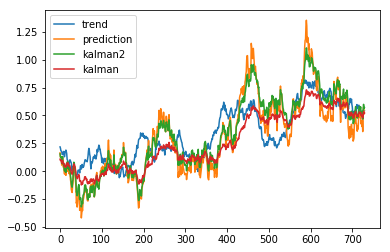

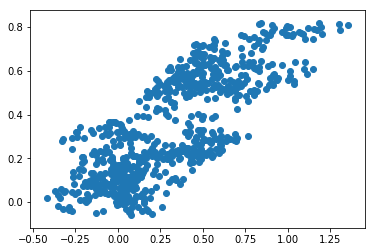

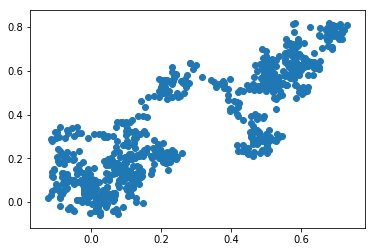

-3.6466350533068193


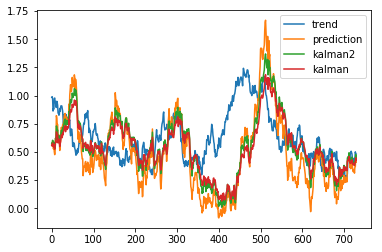

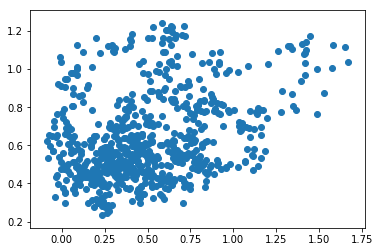

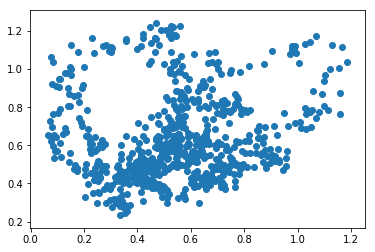

-3.646667688712479


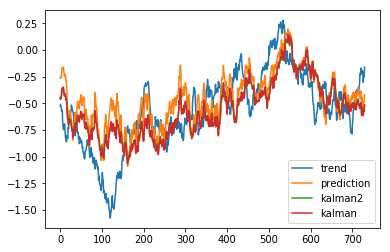

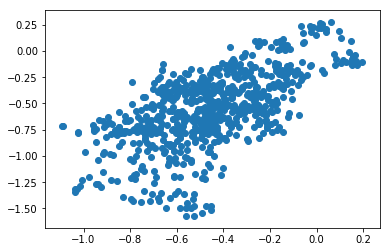

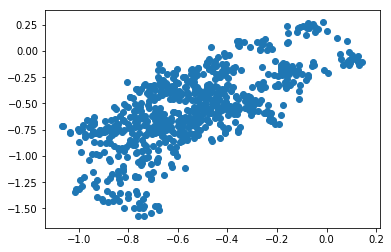

-3.646569701936097


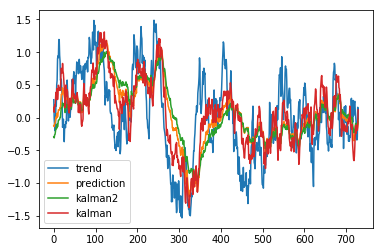

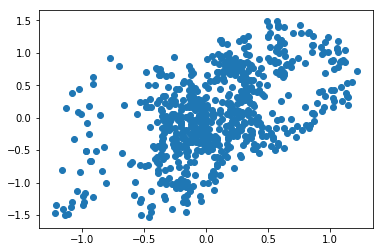

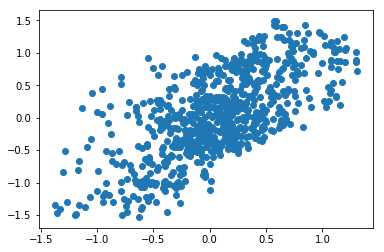

-3.646660133590923


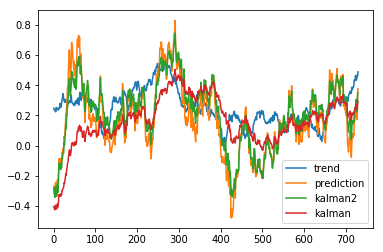

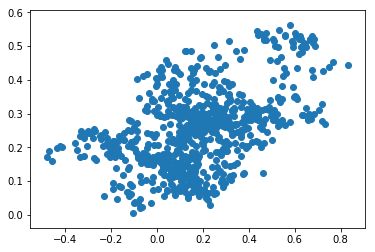

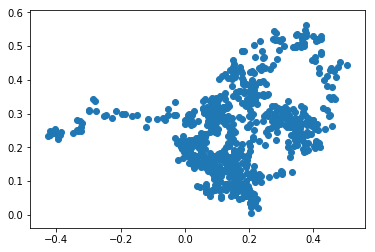

-3.6466025773901505


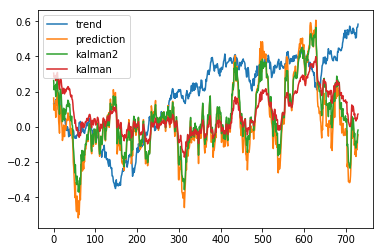

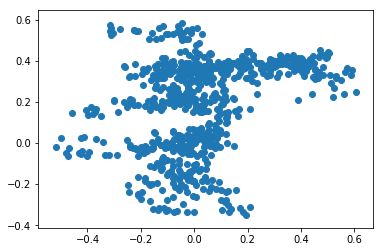

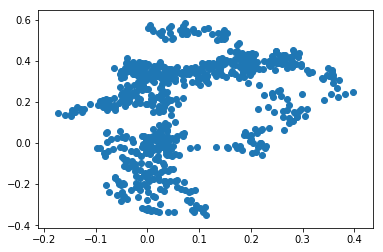

-3.6467505456879747


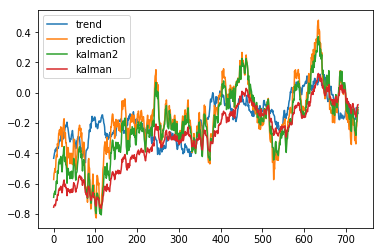

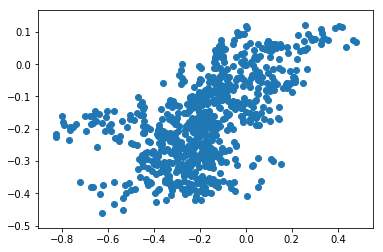

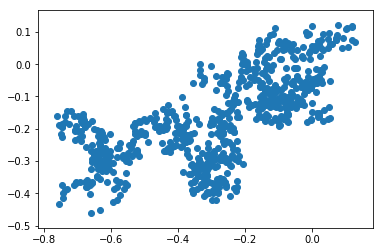

-3.6466320111416293


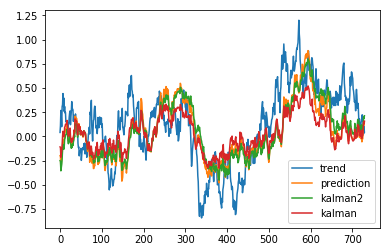

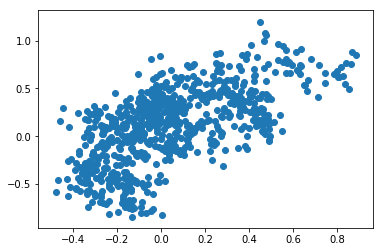

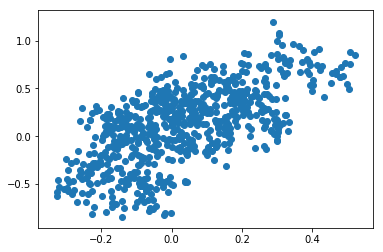

-3.646510086581112


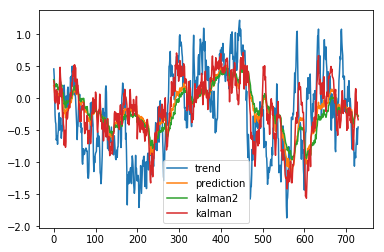

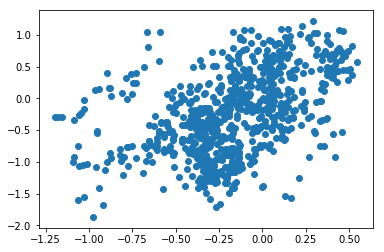

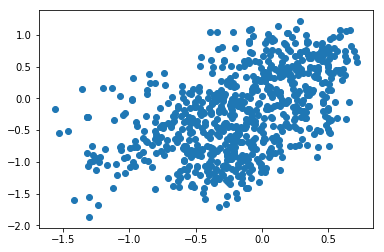

-3.6465986190363777


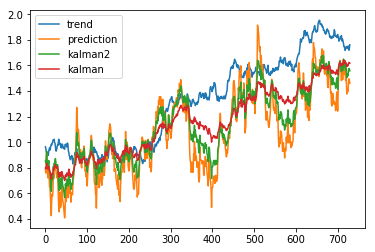

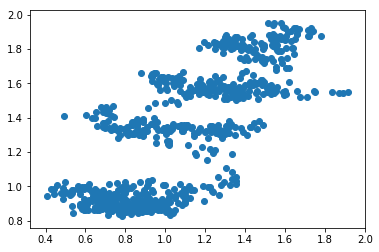

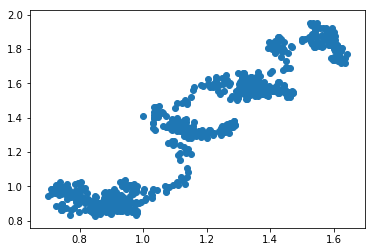

-3.646562403859572


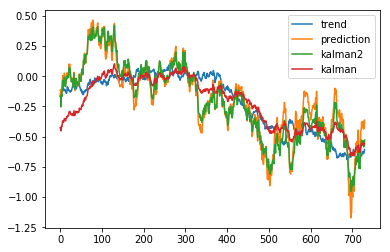

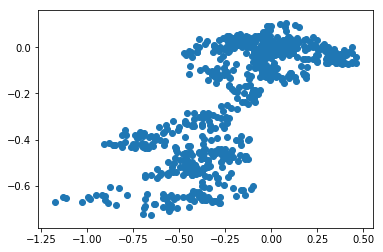

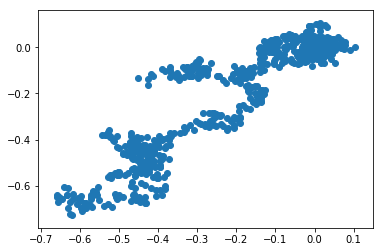

-3.646659609721975


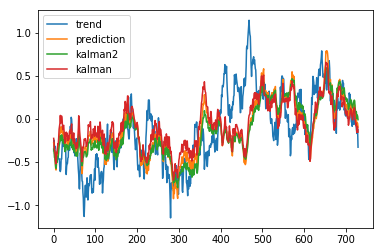

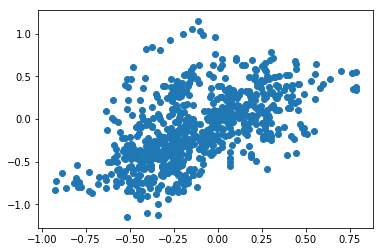

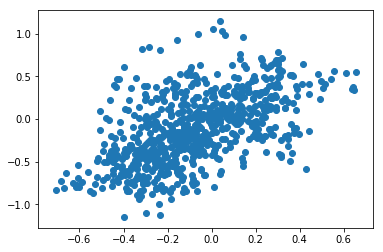

-3.646666104299949


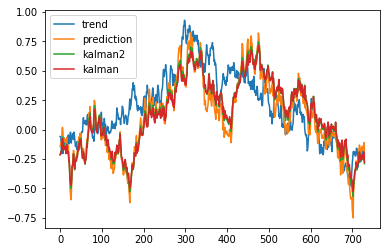

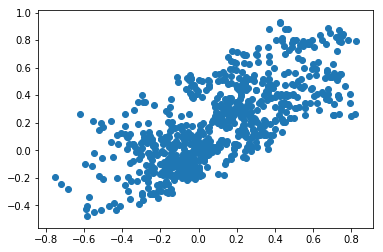

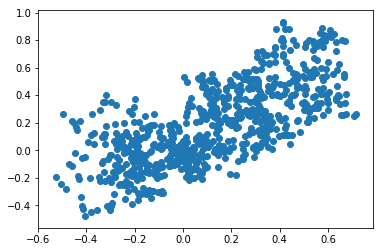

-3.6465670262463403


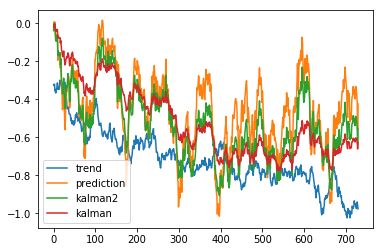

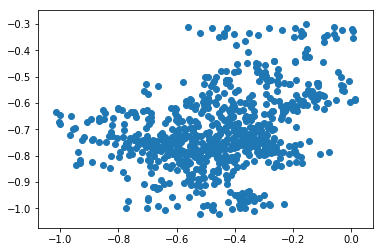

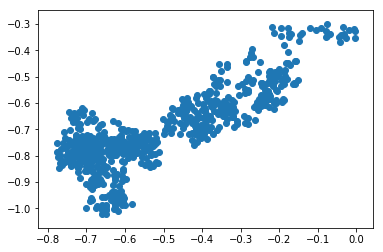

-3.646548254042865


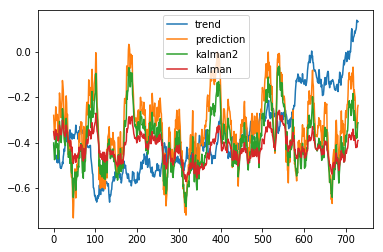

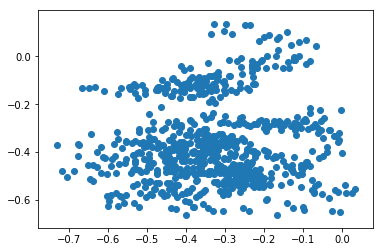

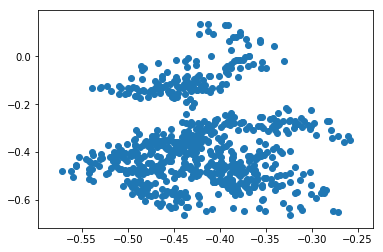

-3.6467023974750203


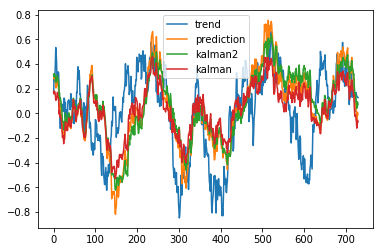

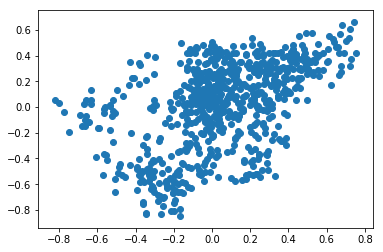

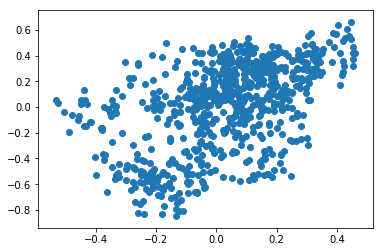

-3.646611469658093


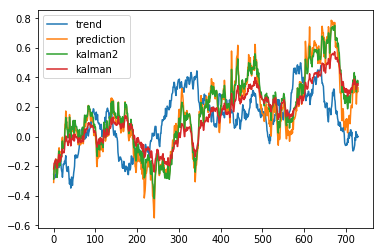

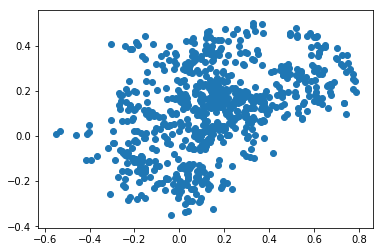

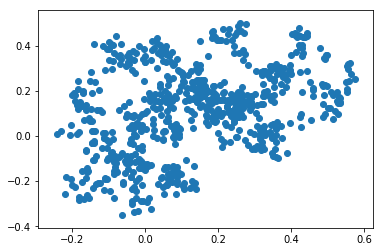

-3.6462333741132182


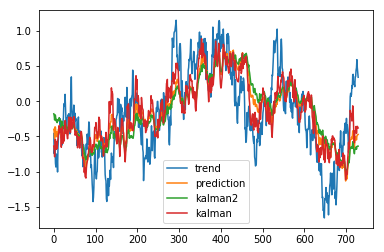

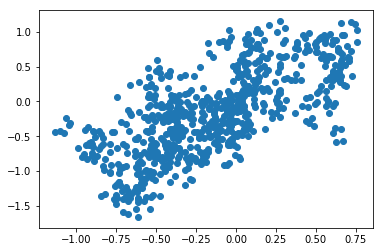

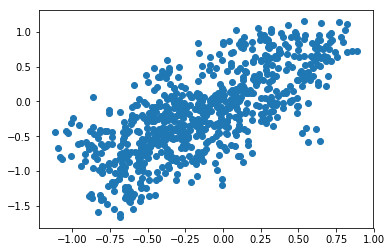

-3.6464997826609773


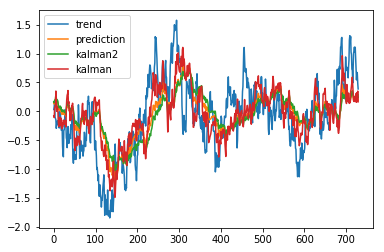

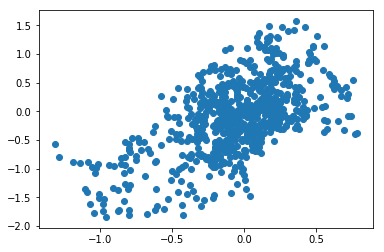

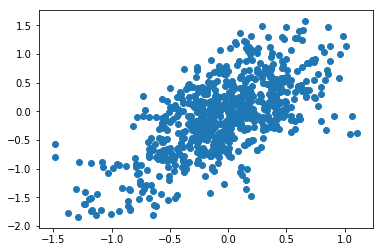

-3.646586034074427


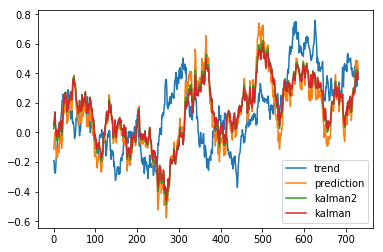

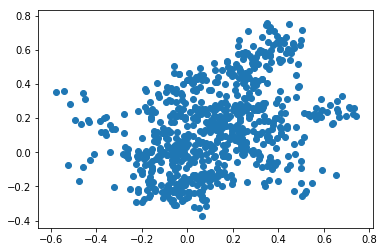

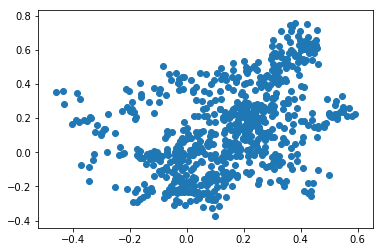

-3.6465495932847274


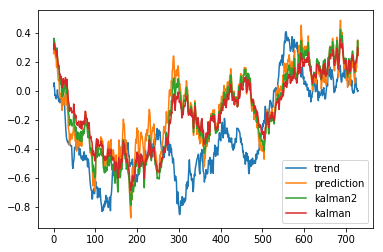

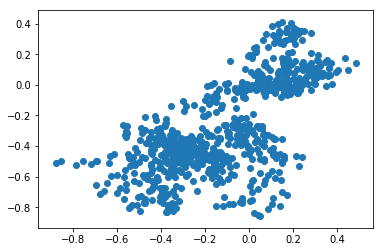

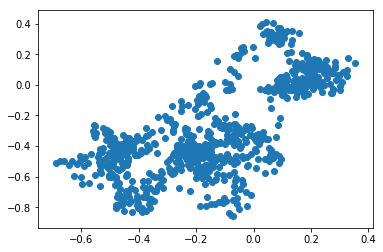

-3.646722063282506


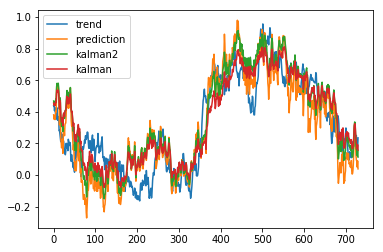

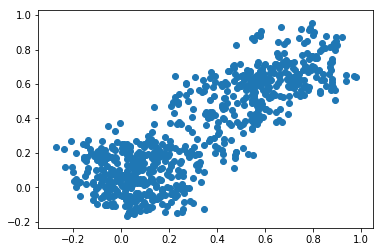

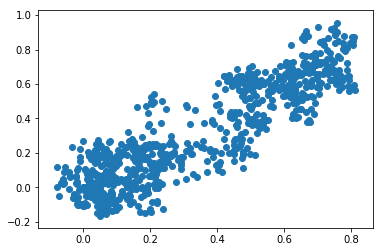

-3.6465733222197754


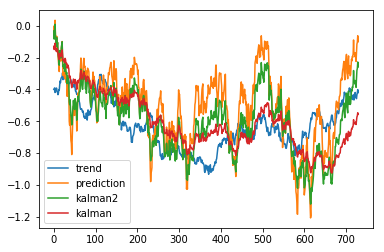

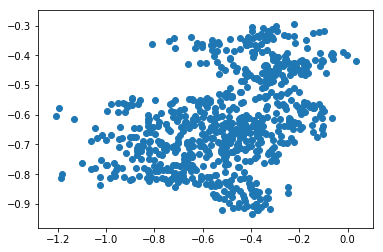

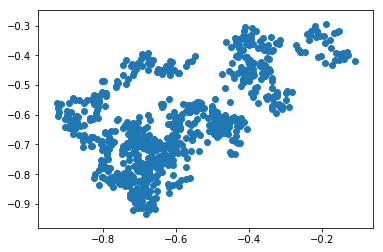

-3.6466479032300425


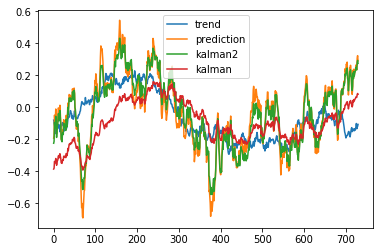

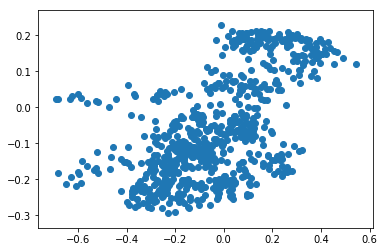

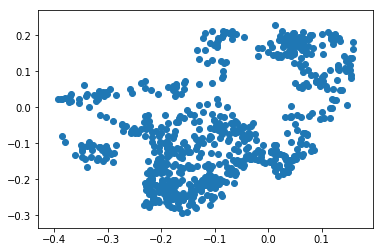

-3.6466126151848597


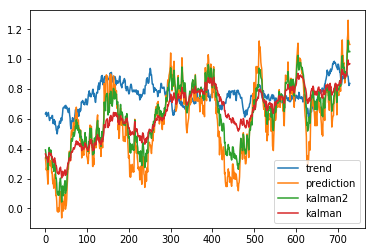

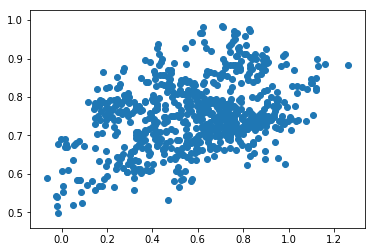

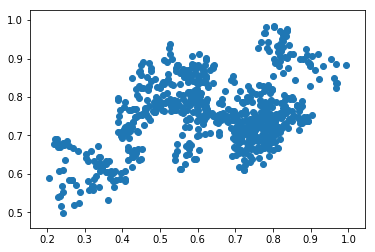

-3.646618038741873


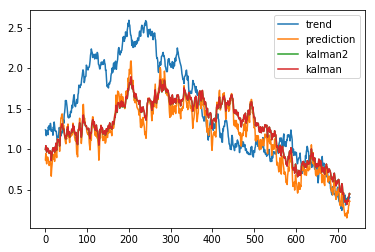

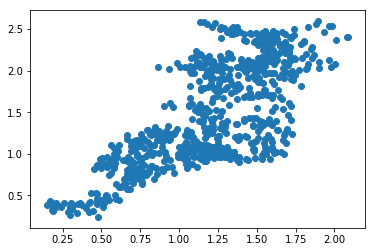

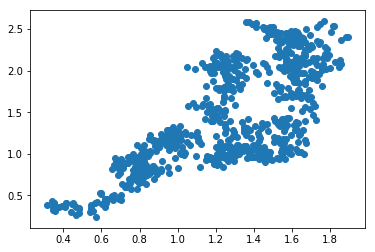

-3.6465678018052143


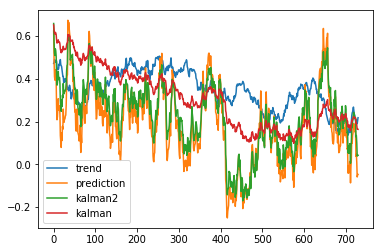

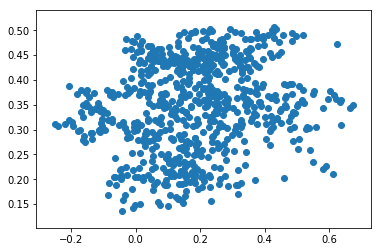

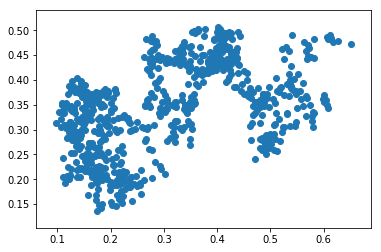

-3.646584768407048


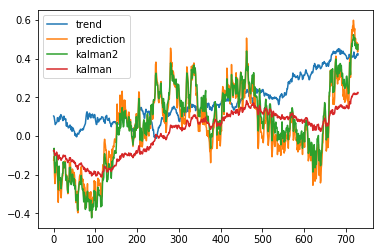

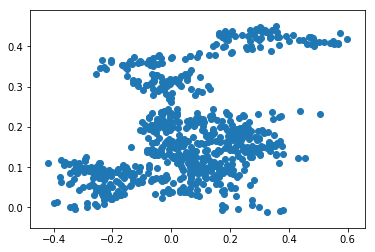

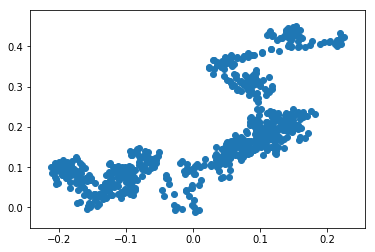

-3.6464226409792913


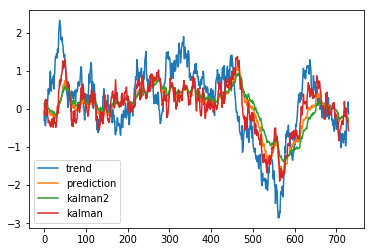

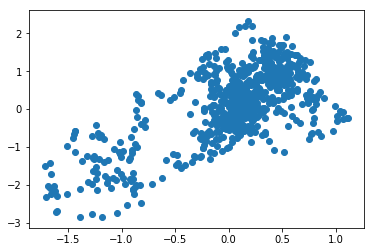

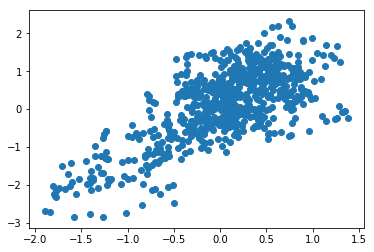

-3.6465799120254827


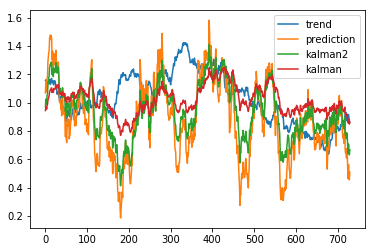

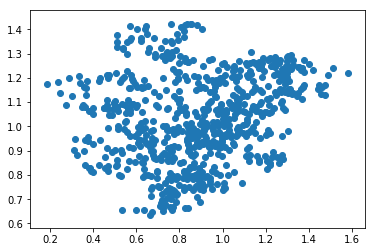

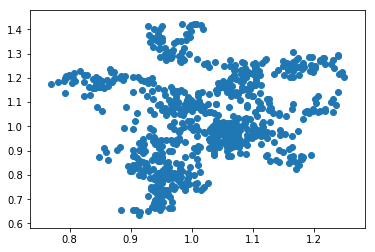

-3.6465389457065625


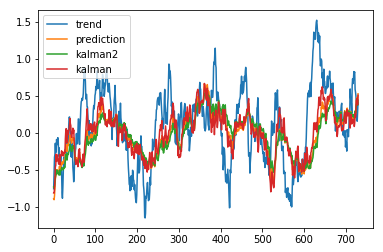

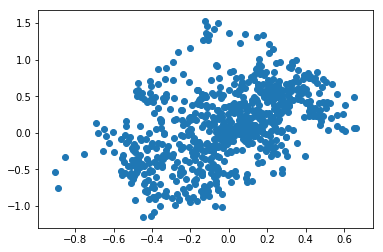

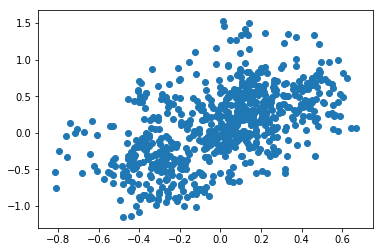

-3.6466237561311585


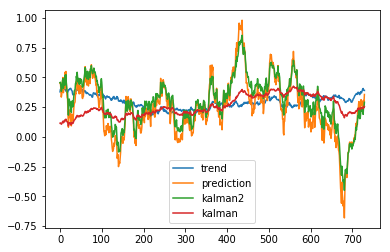

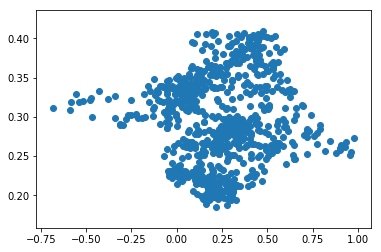

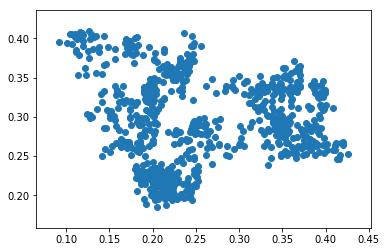

-3.6465116009116185


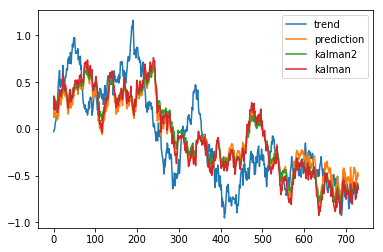

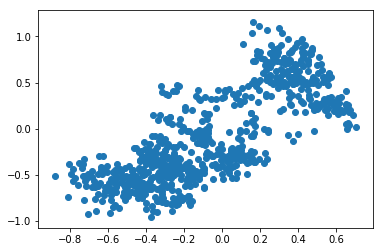

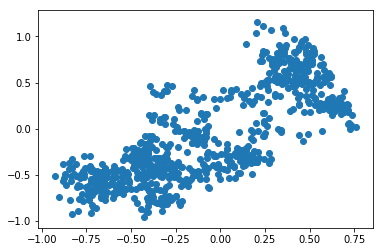

-3.64652818683535


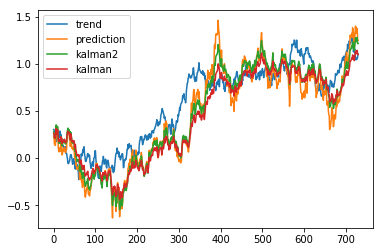

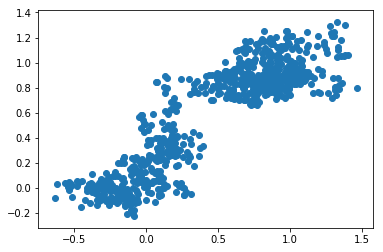

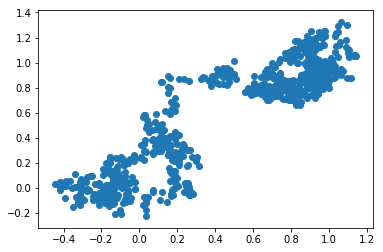

-3.6465683654882026


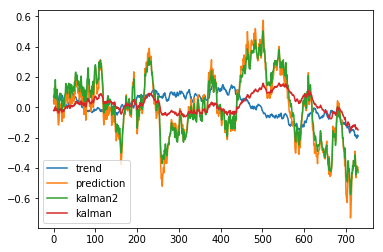

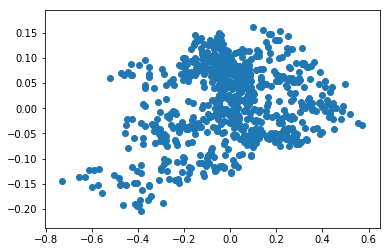

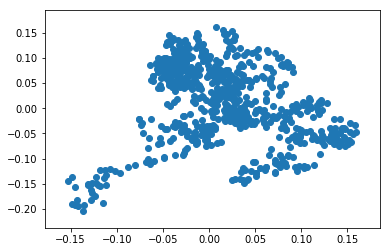

-3.6465792568400515


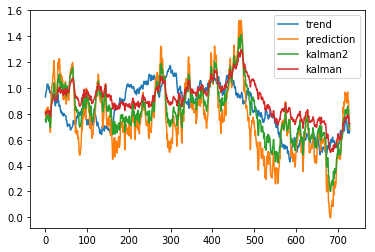

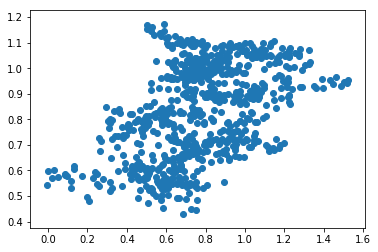

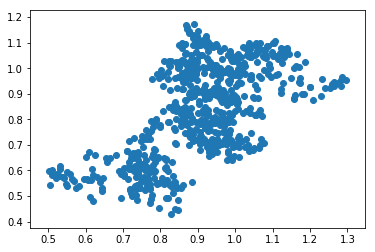

-3.646562563115732


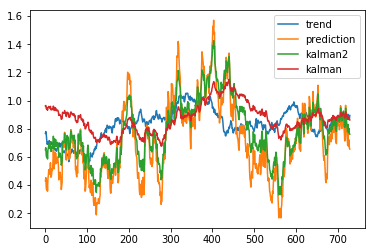

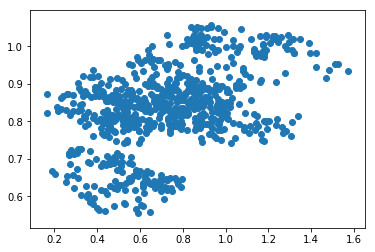

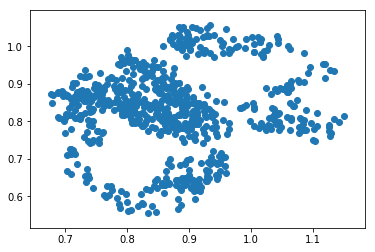

-3.64653342110105


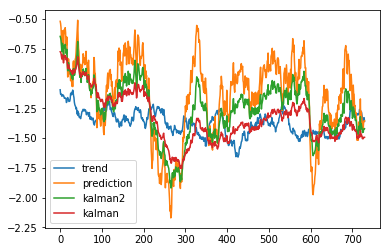

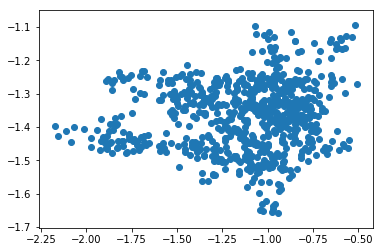

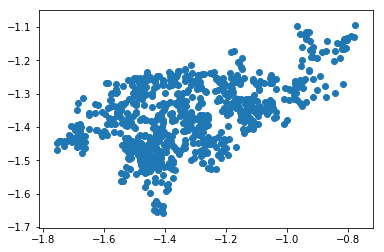

-3.646562285581605


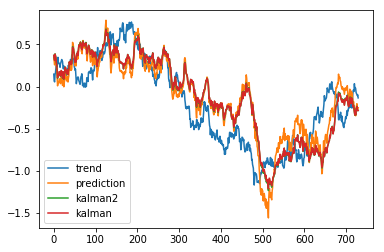

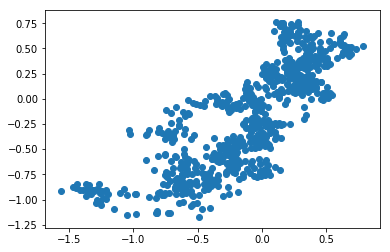

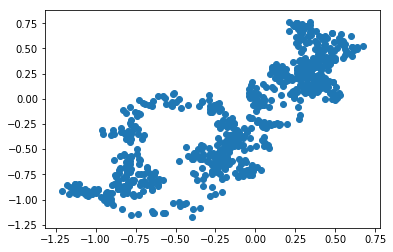

-3.6465794254094375


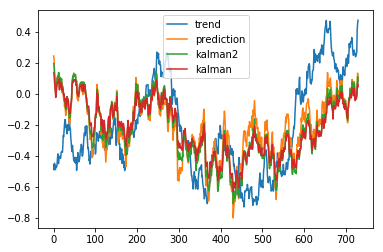

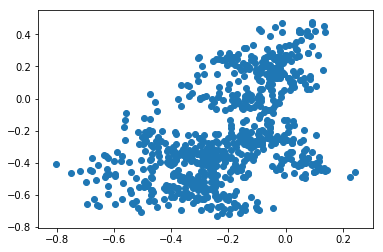

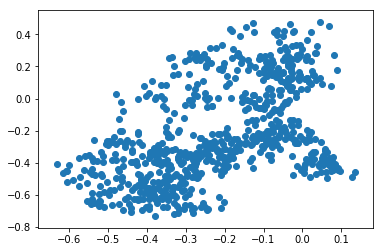

-3.646632531518118


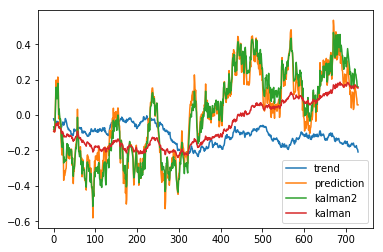

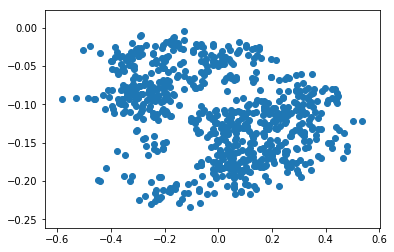

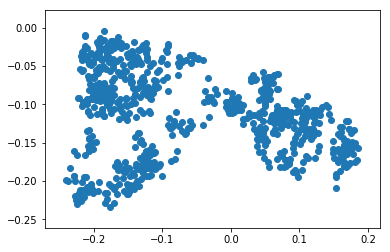

-3.646506216702984


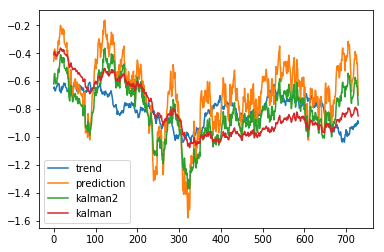

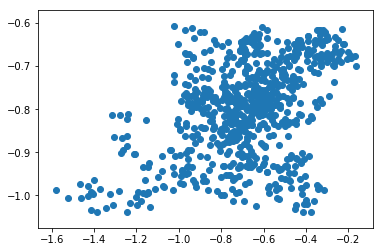

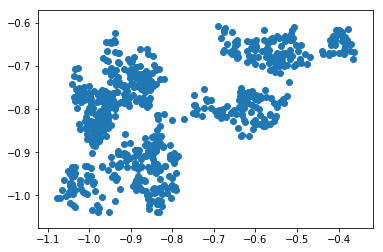

-3.64657950596884


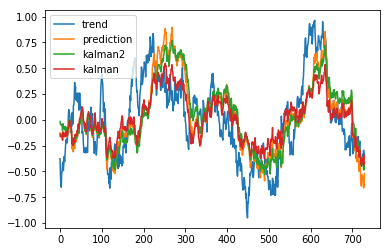

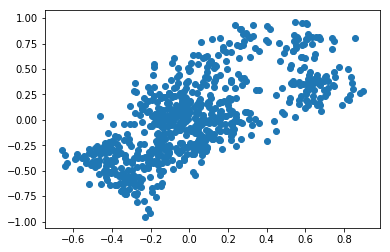

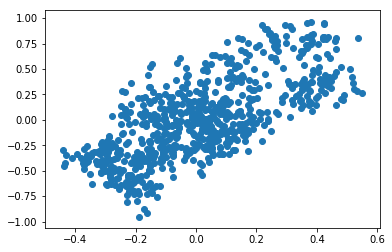

-3.6461848375387502


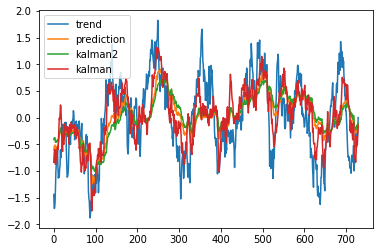

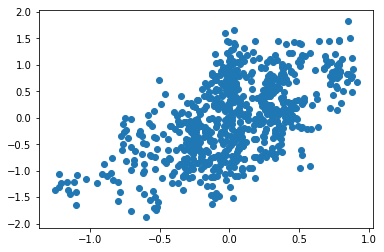

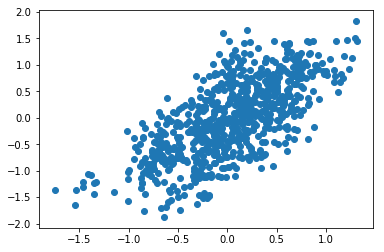

-3.646568184345962


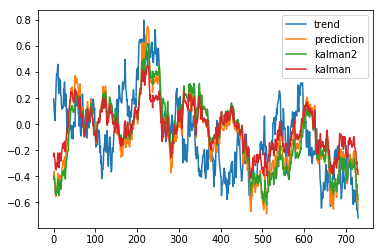

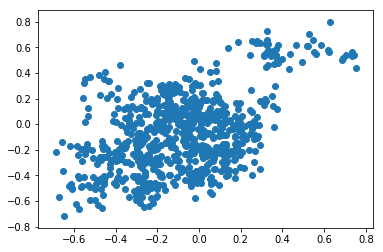

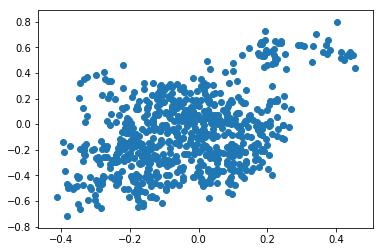

-3.6465457676444215


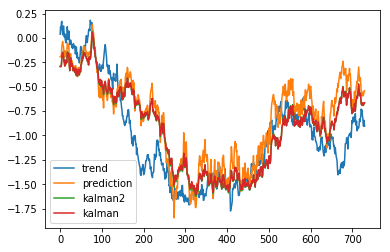

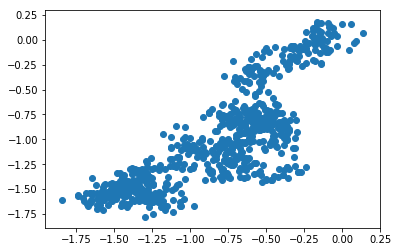

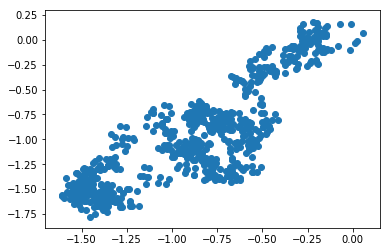

-3.6467099830973906


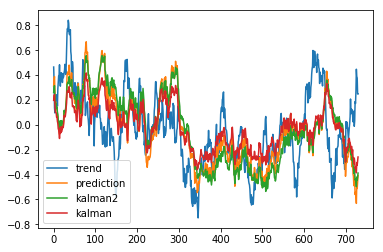

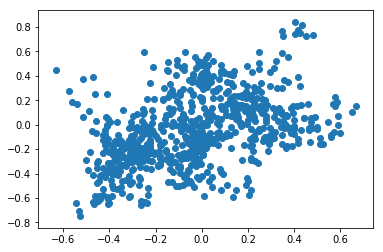

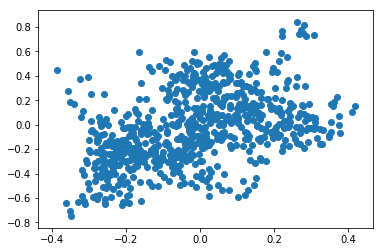

-3.6464968555141253


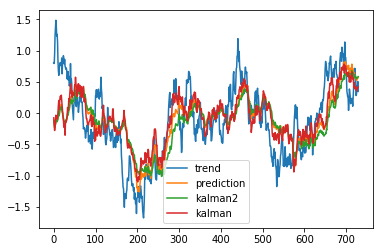

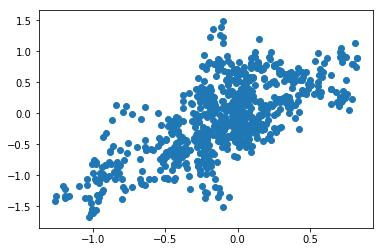

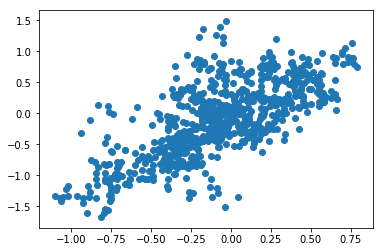

-3.6466138757299644


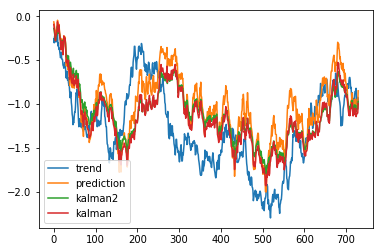

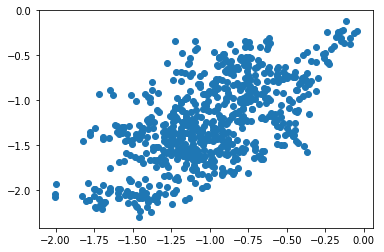

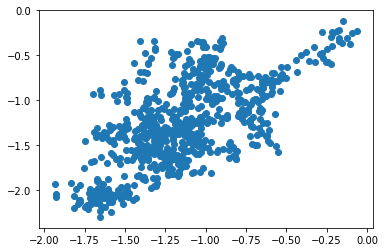

-3.6465717506129307


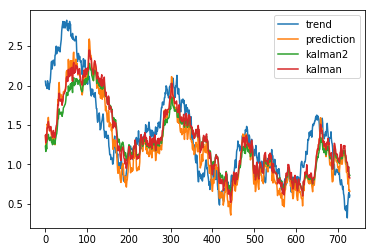

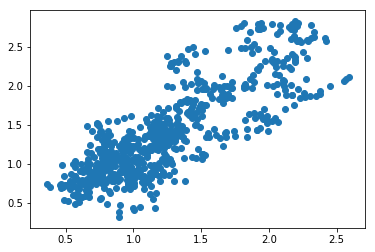

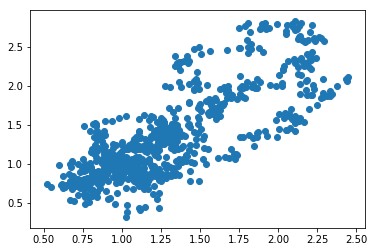

-3.6466622116044176


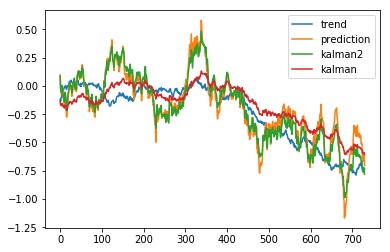

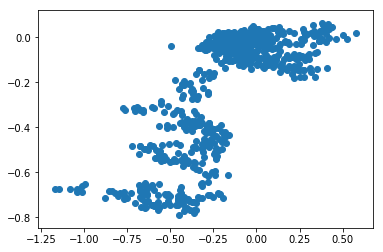

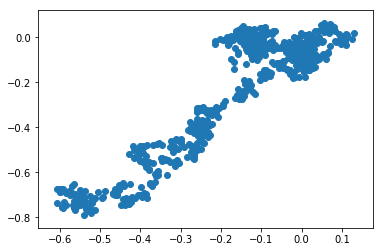

-3.6465473101474357


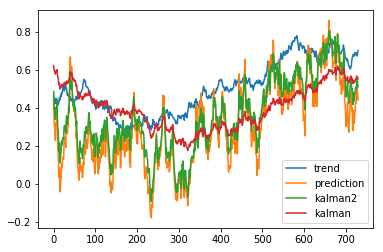

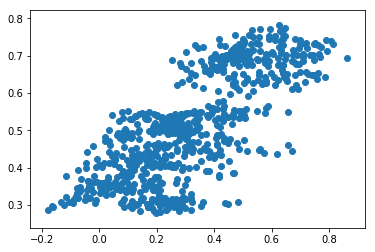

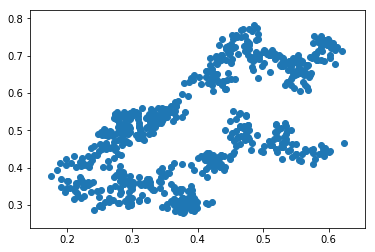

-3.646536283520983


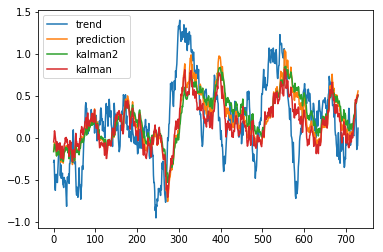

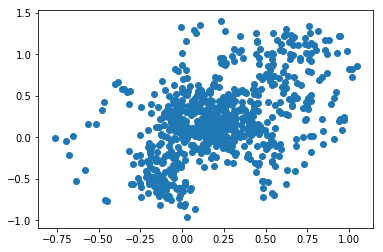

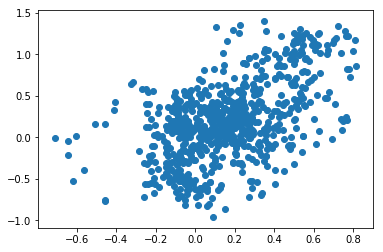

In [11]:
writer = tf.summary.FileWriter(logs_dir, graph)
lrate = 0.001
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(3000):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        variables =tf.trainable_variables()
        if i==1500:
            lrate /= 3.
        
        if i==2250:
            lrate /= 3.
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: lrate,
               grad_clip: 0.1}
        if (i+1) %100 == 0 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        sess.run( [optimizer], feed_dict=feed)
        ## print result
    for i in range(100):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: 0.001,
               grad_clip: 0.1}
        if i> -1 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        

writer.close()   

In [12]:
len(kalman_result[start:])

730

In [13]:
dicti

{'T': 3,
 'deltaT': 0.0027397260273972603,
 'lbd': 10,
 'sigma': 2.043178233581253}

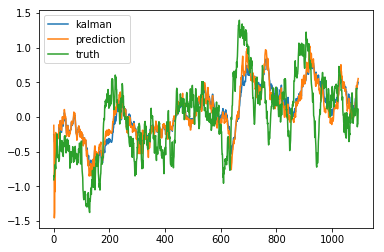

In [14]:
index=0
lbd = 1
sigma = 0.9
sigmaS= 0.1
deltaT= 1./365
kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                 sigmaS =sigmaS ,
                                 lbd=lbd,
                                 sigmamu= sigma,
                                 deltaT=deltaT )
plt.plot(kalman_result, label='kalman' )
#plt.plot(X[index,:,0])
plt.plot( result[1][index,:,0] , label = 'prediction')
plt.plot( trends[1:,0] , label= 'truth')
plt.legend( loc='best')
plt.show()

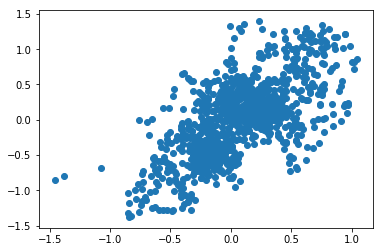

In [15]:
plt.scatter( result[1][0,:,0], trends[1:,0])
plt.show()

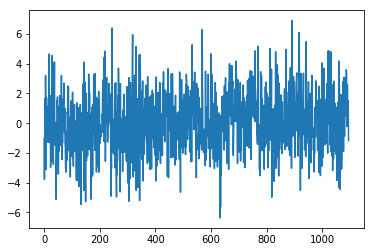

In [16]:
plt.plot(Y[0,:,0])
plt.show()